# Final Project Group M - Flight Fare Predictions

This **advanced analysis** focuses on a dataset of internal flights, aiming to uncover insights and build predictive models. The study begins with an exploratory data analysis to examine the descriptive characteristics of the dataset, such as distributions, trends, and correlations among key variables like flight duration, departure time, and fare prices. Then, multiple regression techniques will be applied, including *linear regression* to assess linear relationships, *polynomial regression* to capture non-linear patterns, and *random forest models* for robust and flexible predictions. Additional advanced analysis will involve evaluating model performance using metrics such as *AIC*, *BIC*, *RMSE*, *MAE* and *$R^2$*. This comprehensive approach aims to provide actionable insights and accurate models for predicting flight fares and understanding influential factors.

**Goal**: The purpose of this analysis is to predict the quantitative variable *price* (response), focusing on identifying key factors that influence it and building accurate predictive models to estimate flight fares.

In [ ]:
# Libraries import
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools
import warnings
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split
import scipy.stats as stats
import xgboost as xgb

# extra
warnings.filterwarnings('ignore')

## Data import and Cleaning

Let’s begin by importing and cleaning the dataset to ensure a structured and organized analysis. This step will involve transforming the data into a clean and well-structured format, laying the foundation for accurate and reliable insights in the subsequent stages of the analysis.

In [46]:
# read data and modify the index
CleanDataset = pd.read_csv("data/Clean_Dataset.csv")
CleanDataset.set_index("Unnamed: 0",inplace=True)
CleanDataset.index.names = ['Index']
CleanDataset.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
Index,,,,,,,,,,,
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


In [47]:
# Statistical Description of data
CleanDataset.describe()

,duration,days_left,price
count,300153.000000,300153.000000,300153.000000
mean,12.221021,26.004751,20889.660523
std,7.191997,13.561004,22697.767366
min,0.830000,1.000000,1105.000000
25%,6.830000,15.000000,4783.000000
50%,11.250000,26.000000,7425.000000
75%,16.170000,38.000000,42521.000000
max,49.830000,49.000000,123071.000000


As we can notice, our dataset has only 3 quantitative variables, *duration*, *days_left* and *price* (our response variable).

**Clean Dataset for Economy and Business**

We created two distinct datasets, CleanDataset_business and CleanDataset_economy starting from Clean_Dataset. This will help us to differentiate the behaviour of the two classes during the analysis. The custom datasets are saved in `/data` folder.

In [ ]:
'''
# Load the CSV file into a DataFrame
df = pd.read_csv('data/Clean_Dataset.csv')

# Split the DataFrame based on the 'class' column
business_class_df = df[df['class'] == 'Business']
economy_class_df = df[df['class'] == 'Economy']

# Save the resulting DataFrames to separate CSV files
business_class_df.to_csv('data/Clean_Dataset_business.csv', index=False)
economy_class_df.to_csv('data/Clean_Dataset_economy.csv', index=False)
'''

"\n# Load the CSV file into a DataFrame\ndf = pd.read_csv('Clean_Dataset.csv')\n\n# Split the DataFrame based on the 'class' column\nbusiness_class_df = df[df['class'] == 'Business']\neconomy_class_df = df[df['class'] == 'Economy']\n\n# Save the resulting DataFrames to separate CSV files\nbusiness_class_df.to_csv('data/Clean_Dataset_business.csv', index=False)\neconomy_class_df.to_csv('data/Clean_Dataset_economy.csv', index=False)\n"

## Explorative Data Analysis

The first phase of the analysis will focus on **descriptive and exploratory analysis** to understand the dataset's structure and uncover initial patterns or trends. This step aims to provide a foundational understanding of the data, ensuring it is ready for more advanced analysis.

### Price Analysis

We explore the number of flights in relationship with the price. We will understand the distribution of the flight prices within the dataset.

             count          mean           std      min      25%      50%  \
class                                                                       
Business   93487.0  52540.081124  12969.314606  12000.0  45185.0  53164.0   
Economy   206666.0   6572.342383   3743.519517   1105.0   4173.0   5772.0   

              75%       max  
class                        
Business  60396.0  123071.0  
Economy    7746.0   42349.0  


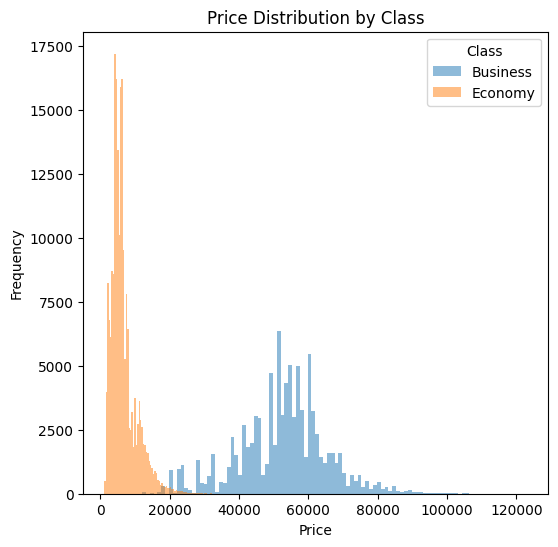

In [49]:
# Histogram price vs frequency colored by class
plt.figure(figsize=(6,6))
for class_name, group in CleanDataset.groupby('class'):
    group['price'].plot(kind='hist', bins=100, alpha=0.5, label=class_name)
plt.title('Price Distribution by Class')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.legend(title='Class')

print(CleanDataset.groupby('class')['price'].describe())


As the graph shows, the majority of flights have relatively low ticket prices, suggesting that they likely belong to the Economy class.

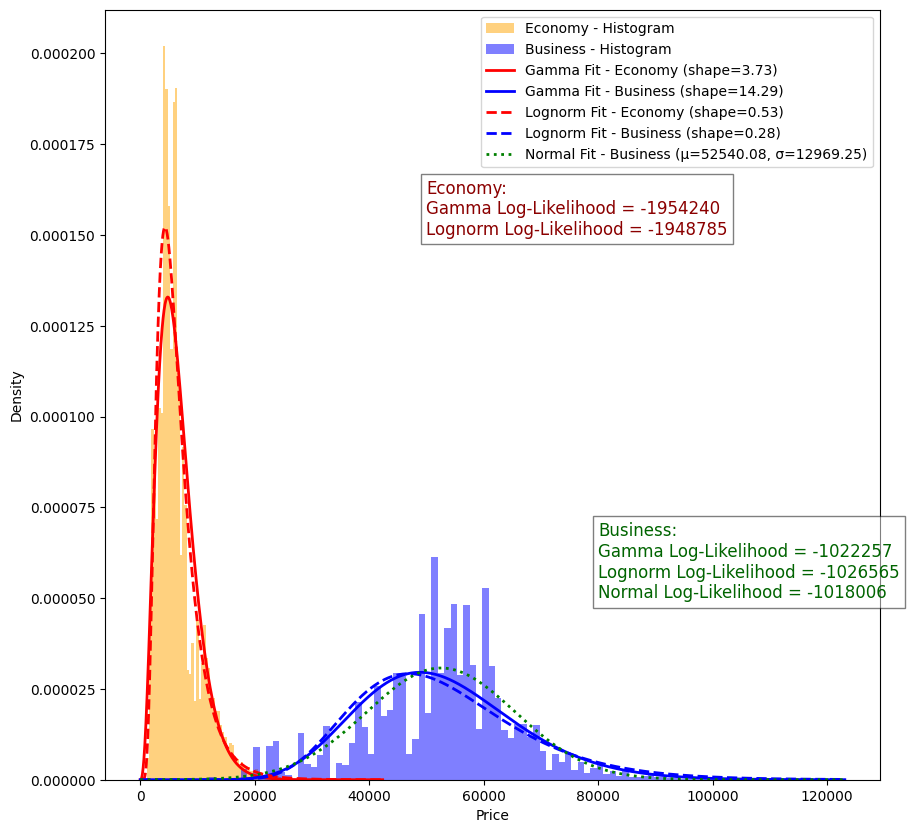

In [108]:
economy_prices = CleanDataset[CleanDataset['class'] == 'Economy']['price']
business_prices = CleanDataset[CleanDataset['class'] == 'Business']['price']

x_values_econ = np.linspace(0, max(economy_prices), 1000)
x_values_bus = np.linspace(0, max(business_prices), 1000)

#Gamma Distribution
shape_econ, loc_econ, scale_econ = stats.gamma.fit(economy_prices, floc=0)
shape_bus, loc_bus, scale_bus = stats.gamma.fit(business_prices, floc=0)

pdf_econ = stats.gamma.pdf(x_values_econ, shape_econ, loc_econ, scale_econ)
pdf_bus = stats.gamma.pdf(x_values_bus, shape_bus, loc_bus, scale_bus)

#Lognormal Distribution
shape_econ_ln, loc_econ_ln, scale_econ_ln = stats.lognorm.fit(economy_prices, floc=0)
shape_bus_ln, loc_bus_ln, scale_bus_ln = stats.lognorm.fit(business_prices, floc=0)

pdf_econ_ln = stats.lognorm.pdf(x_values_econ, shape_econ_ln, loc_econ_ln, scale_econ_ln)
pdf_bus_ln = stats.lognorm.pdf(x_values_bus, shape_bus_ln, loc_bus_ln, scale_bus_ln)

#Normal Distribution
mu_bus, sigma_bus = np.mean(business_prices), np.std(business_prices)
pdf_bus_norm = stats.norm.pdf(x_values_bus, mu_bus, sigma_bus)

#Log-Likelihood
log_likelihood_econ_gamma = np.sum(stats.gamma.logpdf(economy_prices, shape_econ, loc_econ, scale_econ))
log_likelihood_bus_gamma = np.sum(stats.gamma.logpdf(business_prices, shape_bus, loc_bus, scale_bus))

log_likelihood_econ_ln = np.sum(stats.lognorm.logpdf(economy_prices, shape_econ_ln, loc_econ_ln, scale_econ_ln))
log_likelihood_bus_ln = np.sum(stats.lognorm.logpdf(business_prices, shape_bus_ln, loc_bus_ln, scale_bus_ln))

log_likelihood_bus_norm = np.sum(stats.norm.logpdf(business_prices, mu_bus, sigma_bus))

plt.figure(figsize=(10, 10))
plt.hist(economy_prices, bins=100, alpha=0.5, color='orange', density=True, label="Economy - Histogram")
plt.hist(business_prices, bins=100, alpha=0.5, color='blue', density=True, label="Business - Histogram")
plt.plot(x_values_econ, pdf_econ, 'red', lw=2,  label=f"Gamma Fit - Economy (shape={shape_econ:.2f})")
plt.plot(x_values_bus, pdf_bus, 'blue', lw=2,  label=f"Gamma Fit - Business (shape={shape_bus:.2f})")
plt.plot(x_values_econ, pdf_econ_ln, 'red', lw=2, linestyle="dashed", label=f"Lognorm Fit - Economy (shape={shape_econ_ln:.2f})")
plt.plot(x_values_bus, pdf_bus_ln, 'blue', lw=2, linestyle="dashed", label=f"Lognorm Fit - Business (shape={shape_bus_ln:.2f})")
plt.plot(x_values_bus, pdf_bus_norm, 'green', lw=2, linestyle="dotted", label=f"Normal Fit - Business (μ={mu_bus:.2f}, σ={sigma_bus:.2f})")
plt.text(50000, 0.00015, f"Economy:\nGamma Log-Likelihood = {log_likelihood_econ_gamma:.0f}\nLognorm Log-Likelihood = {log_likelihood_econ_ln:.0f}", fontsize=12, color="darkred", bbox=dict(facecolor="white", alpha=0.5))
plt.text(80000, 0.00005, f"Business:\nGamma Log-Likelihood = {log_likelihood_bus_gamma:.0f}\nLognorm Log-Likelihood = {log_likelihood_bus_ln:.0f}\nNormal Log-Likelihood = {log_likelihood_bus_norm:.0f}",
         fontsize=12, color="darkgreen", bbox=dict(facecolor="white", alpha=0.5))
plt.xlabel("Price")
plt.ylabel("Density")
plt.legend()
plt.show()

It is easy to observe that the price distribution exhibits two distinct peaks: one for economy class and the other for business class, making it a bimodal distribution.

The first peak corresponds to the economy class, which is characterized by a highly right-skewed distribution. Both the Gamma and Lognormal distributions align with the peak of the histogram, but the Lognormal distribution appears to better capture the overall shape of the data.

The second peak corresponds to the business class, where the Gamma distribution provides a better fit for the central part of the data compared to the Lognormal distribution.

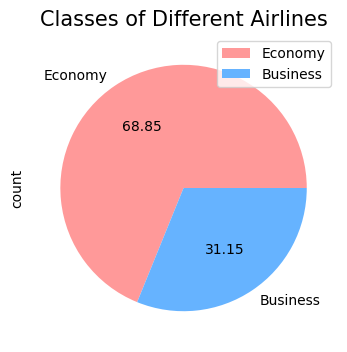

In [5]:
plt.figure(figsize=(4,4))
colors = ['#ff9999', '#66b3ff']  # Custom colors for the pie chart
CleanDataset['class'].value_counts().plot(kind='pie', textprops={'color':'black'}, autopct='%.2f', colors=colors)
plt.title('Classes of Different Airlines', fontsize=15)
plt.legend(['Economy', 'Business'])
plt.show()

The pie chart indicates that the majority of flights belong to the Economy class, accounting for nearly 70% of all flights.

In future model training, we can expect the model to predict lower prices (corresponding to Economy class) more accurately than higher prices. This suggests that the class feature will play a crucial role in price prediction.

Therefore, it would be reasonable to consider splitting the dataset into two subsets and training separate models for Economy and Business class flights.

**Explore the Price with respect to the *Airline*.**

airline       AirAsia     Air_India      GO_FIRST        Indigo      SpiceJet  \
count    16098.000000  80892.000000  23173.000000  43120.000000   9011.000000   
mean      4091.072742  23507.019112   5652.007595   5324.216303   6179.278881   
std       2824.055172  20905.116909   2513.865560   3268.894831   2999.630406   
min       1105.000000   1526.000000   1105.000000   1105.000000   1106.000000   
25%       2361.000000   5623.000000   4205.000000   3219.000000   4197.000000   
50%       3276.000000  11520.000000   5336.000000   4453.000000   5654.000000   
75%       4589.000000  45693.000000   6324.000000   6489.000000   7412.000000   
max      31917.000000  90970.000000  32803.000000  31952.000000  34158.000000   

airline        Vistara  
count    127859.000000  
mean      30396.536302  
std       25637.159445  
min        1714.000000  
25%        6412.000000  
50%       15543.000000  
75%       55377.000000  
max      123071.000000  


<Axes: >

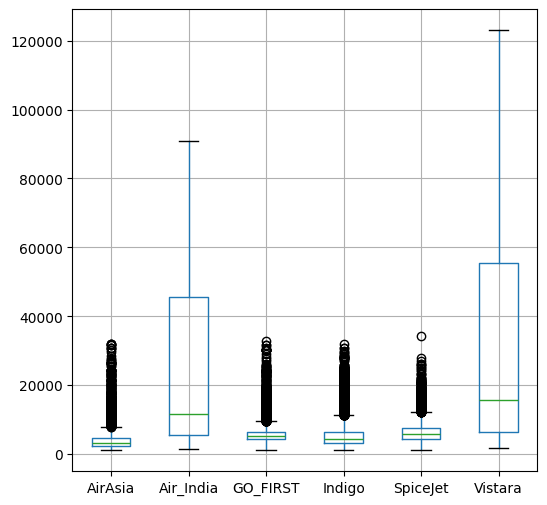

In [51]:
airline_df = CleanDataset.pivot(columns='airline',values='price')
print(airline_df.describe())

airline_df.boxplot(figsize=(6,6))

It is observed that *Vistara* and *Air India* have the highest price distributions compared to other airline companies. Specifically, their median, maximum values, and interquartile range (IQR) are notably higher.

In particular, a wider interquartile range indicates greater variability in ticket prices. The higher median and maximum values for *Vistara* and *Air India* suggest that these airlines offer a significant number of business-class tickets.

**Price Distribution by Airline and Class**

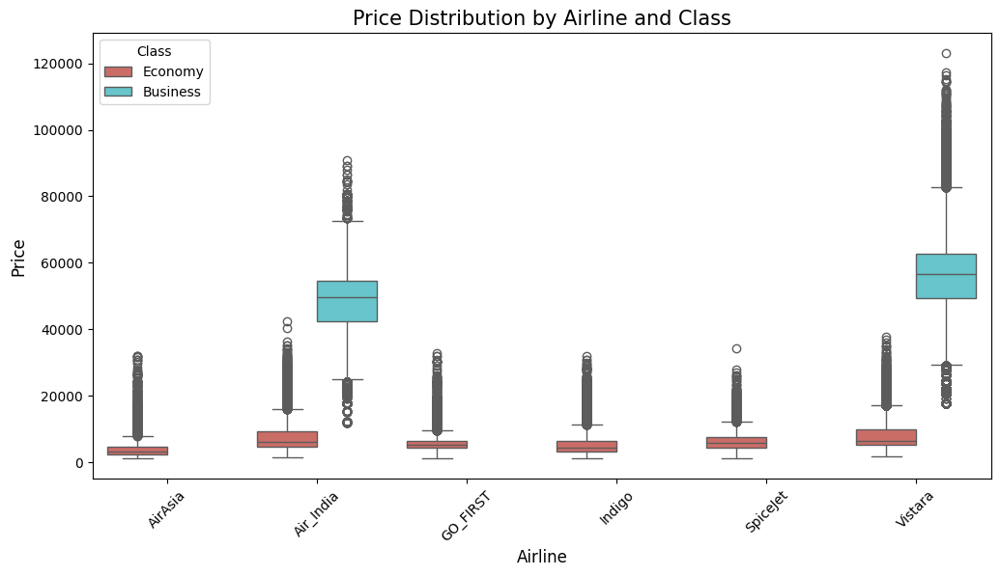

In [7]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='airline', y='price', hue='class', data=CleanDataset.sort_values('airline'), palette='hls')
plt.title('Price Distribution by Airline and Class', fontsize=15)
plt.xlabel('Airline', fontsize=12)
plt.ylabel('Price', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Class')
plt.show()

As previously mentioned, only *Air India* and *Vistara* offer business-class tickets. It is notable that Economy class has lower and more stable ticket prices, with similar median values and interquartile ranges (IQR) across airlines. However, Air India and Vistara exhibit slightly higher median values even for Economy class.

For Business class, it is important to note that both airlines have a large interquartile range, indicating high price variability. Additionally, numerous outliers are visible for Vistara and Air India, whereas budget airlines show a more stable fare structure.

Given these factors, we can expect *Vistara* and *Air India* to have a more significant influence during the prediction phase.

**How Does the Price vary with the number of stops of a Flight?**

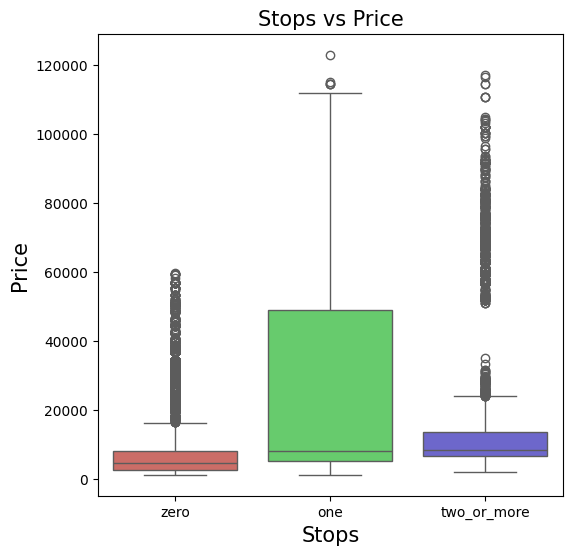

In [52]:
plt.figure(figsize=(6,6))
sns.boxplot(x='stops',y='price',data=CleanDataset,palette='hls')
plt.title('Stops vs Price',fontsize=15)
plt.xlabel('Stops',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

The box plot shows that flights with one stop have the highest price variability, with a larger interquartile range (IQR) and a higher median compared to zero-stop and multi-stop flights. Outliers are present in all categories, but they are more extreme for one-stop flights, reaching over 120,000. Zero-stop and multi-stop flights have lower and more stable prices, with similar median values and smaller IQRs. The numerous high-priced outliers in one-stop and multi-stop flights suggest the presence of premium or business-class fares, while direct flights appear to offer more consistent pricing.

**Stops with respect to Price, divided by class**

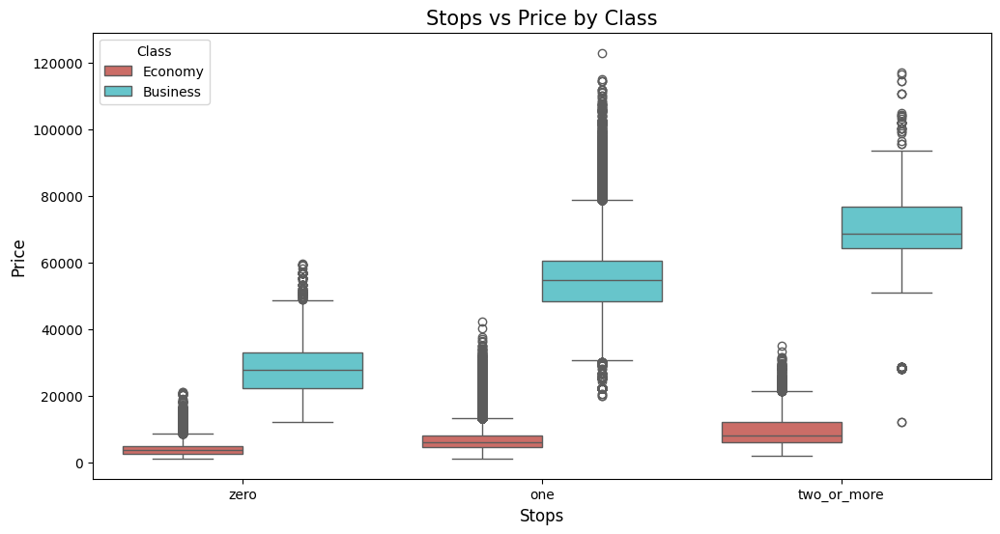

In [53]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=pd.Categorical(CleanDataset['stops'], categories=['zero', 'one', 'two_or_more'], ordered=True), y='price', hue='class', data=CleanDataset, palette='hls')
plt.title('Stops vs Price by Class', fontsize=15)
plt.xlabel('Stops', fontsize=12)
plt.ylabel('Price', fontsize=12)
plt.legend(title='Class')
plt.show()

Business class fares are consistently higher than Economy class fares across all stop categories. Prices generally increase with the number of stops, especially for Business class, where flights with two or more stops have the highest median price and the greatest variability. Outliers are present in both classes, particularly in Business class, where price fluctuations are more pronounced.

**Average Price for Source and Destination**

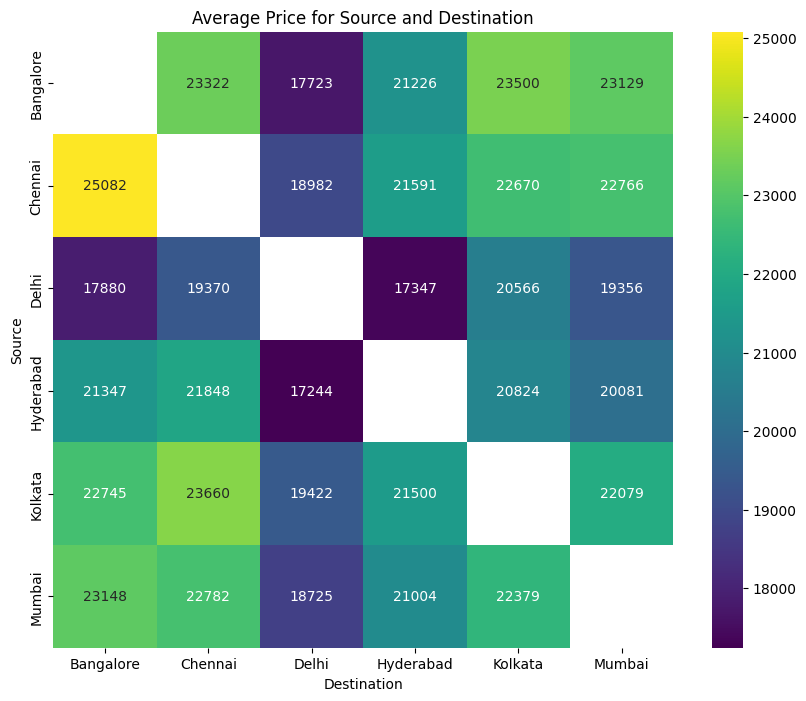

In [54]:
heatmap_data = CleanDataset.pivot_table(
    index='source_city', 
    columns='destination_city', 
    values='price', 
    aggfunc='mean'
)

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="viridis")
plt.title("Average Price for Source and Destination")
plt.xlabel("Destination")
plt.ylabel("Source")
plt.show()

This heatmap visualizes the average ticket price between different source and destination cities. The highest average prices can be attributed to the presence of business-class tickets or the lack of direct flights. Conversely, lower average prices are likely due to routes with high competition and multiple flight options.


**How does the price affected on the days left for Departure?**

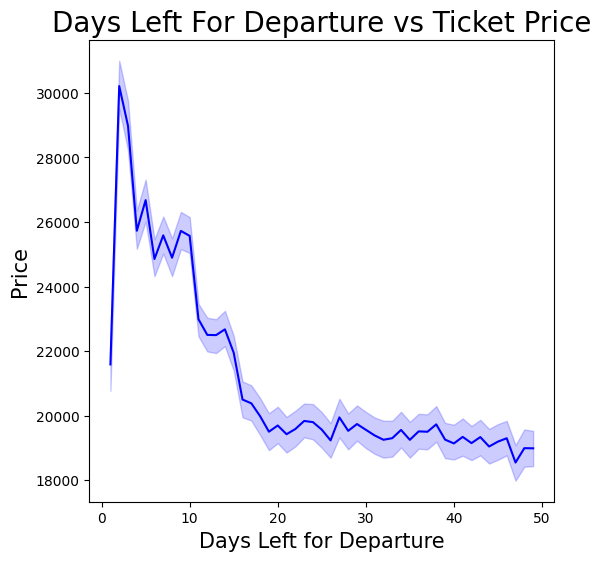

In [55]:
plt.figure(figsize=(6,6))
sns.lineplot(data=CleanDataset,x='days_left',y='price',color='blue')
plt.title('Days Left For Departure vs Ticket Price',fontsize=20)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

This line plot illustrates the relationship between the number of days left before departure and ticket price. Ticket prices spike within the 0–15 days before departure, after which they stabilize. The graph suggests a negative correlation between price and days left, highlighting a non-linear relationship.

**Days left for departure vs Ticket Price divided by class**

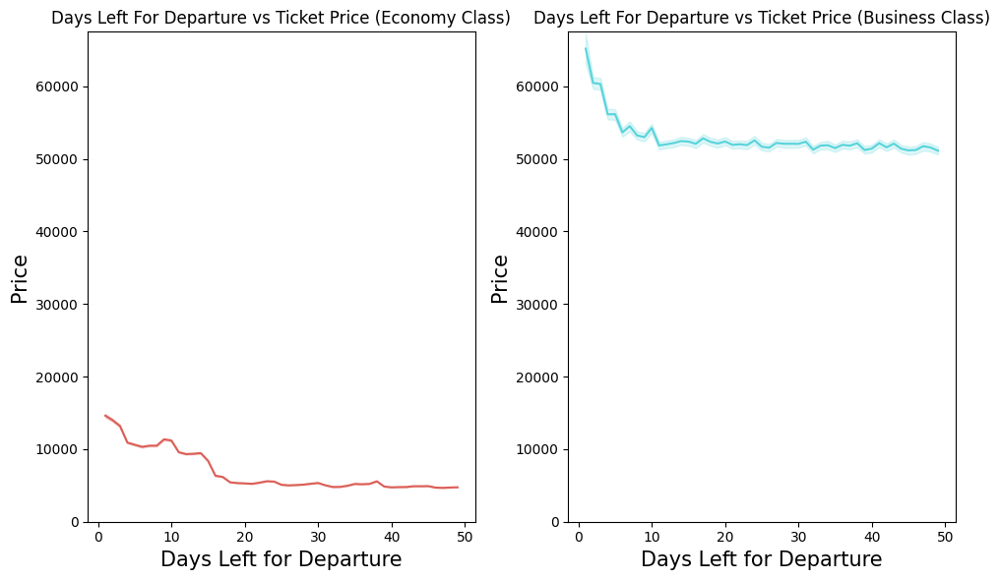

In [56]:
plt.figure(figsize=(14,6))

plt.subplot(1, 3, 2)
sns.lineplot(data=CleanDataset[CleanDataset['class'] == 'Economy'], x='days_left', y='price', palette='hls', color=sns.color_palette('hls')[0])  # Using dark red as the first color
plt.title('Days Left For Departure vs Ticket Price (Economy Class)', fontsize=12)
plt.xlabel('Days Left for Departure', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.ylim(0, 67500)  

plt.subplot(1, 3, 3)
sns.lineplot(data=CleanDataset[CleanDataset['class'] == 'Business'], x='days_left', y='price', palette='hls', color=sns.color_palette('hls')[3])
plt.title('Days Left For Departure vs Ticket Price (Business Class)', fontsize=12)
plt.xlabel('Days Left for Departure', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.ylim(0, 67500)  

plt.tight_layout()
plt.show()

For both classes, ticket price decreases as days left for departure increase. As mentioned before, ticket price for Business class is higher.

**How Price Varies with the Flight Duration Based on Class?**

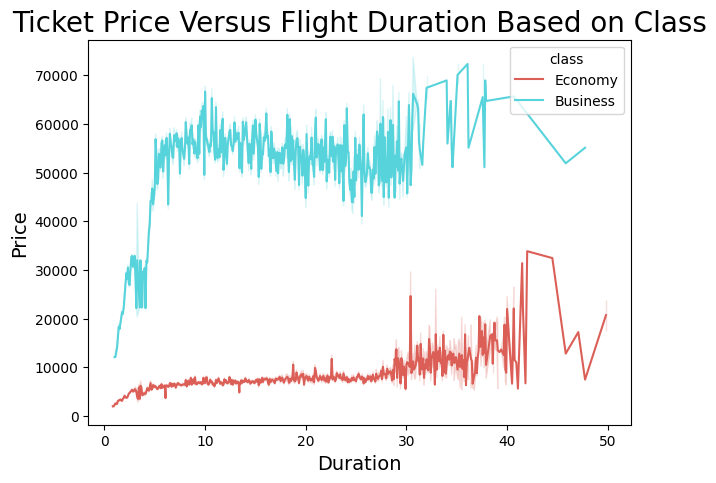

In [57]:
plt.figure(figsize=(7,5))
sns.lineplot(data=CleanDataset,x='duration',y='price',hue='class',palette='hls')
plt.title('Ticket Price Versus Flight Duration Based on Class',fontsize=20)
plt.xlabel('Duration',fontsize=14)
plt.ylabel('Price',fontsize=14)
plt.show()

This line plot visualizes the relationship between flight duration and ticket price, distinguishing between Economy and Business classes. Ticket prices clearly increase with longer flight durations, with Business class fares rising more steeply than Economy. There is a positive correlation between flight duration and price, largely because longer durations are often associated with flights that have more stops.

**Price related with duration, divided by class**

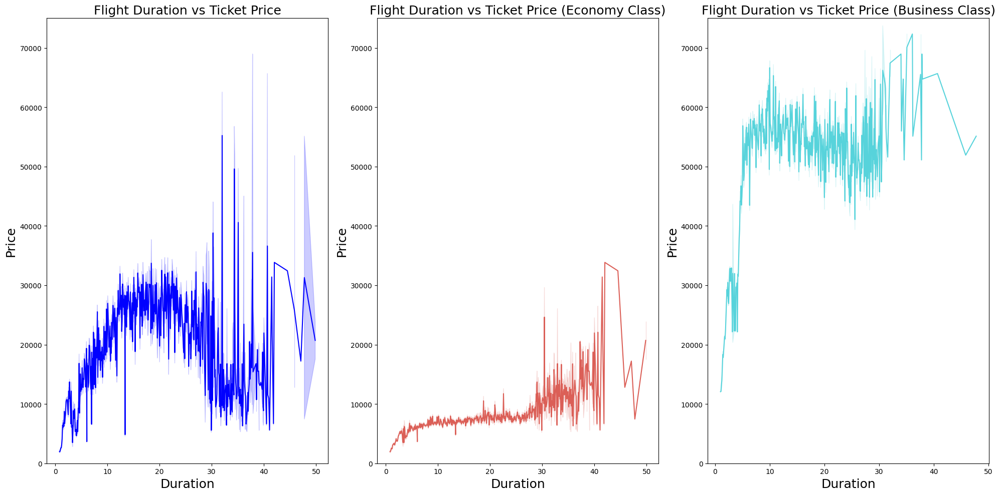

In [58]:
plt.figure(figsize=(20,10))

plt.subplot(1, 3, 1)
sns.lineplot(data=CleanDataset, x='duration', y='price', color='blue')
plt.title('Flight Duration vs Ticket Price', fontsize=18)
plt.xlabel('Duration', fontsize=18)
plt.ylabel('Price', fontsize=18)
plt.ylim(0, 75000)  

plt.subplot(1, 3, 2)
sns.lineplot(data=CleanDataset[CleanDataset['class'] == 'Economy'], x='duration', y='price', palette='hls', color=sns.color_palette('hls')[0])
plt.title('Flight Duration vs Ticket Price (Economy Class)', fontsize=18)
plt.xlabel('Duration', fontsize=18)
plt.ylabel('Price', fontsize=18)
plt.ylim(0, 75000)  

plt.subplot(1, 3, 3)
sns.lineplot(data=CleanDataset[CleanDataset['class'] == 'Business'], x='duration', y='price', palette='hls', color=sns.color_palette('hls')[3])
plt.title('Flight Duration vs Ticket Price (Business Class)', fontsize=18)
plt.xlabel('Duration', fontsize=18)
plt.ylabel('Price', fontsize=18)
plt.ylim(0, 75000)  

plt.tight_layout()
plt.show()

### Correlation Analysis

Let us delve deeper into the information in our dataset and begin to understand the correlation that exists between our variables and price.

In [59]:
# Drop the column flight -> will be unuseful henceforth
CleanDataset = CleanDataset.drop(columns=['flight'])

**Correlation in the dataset (all covariates)**

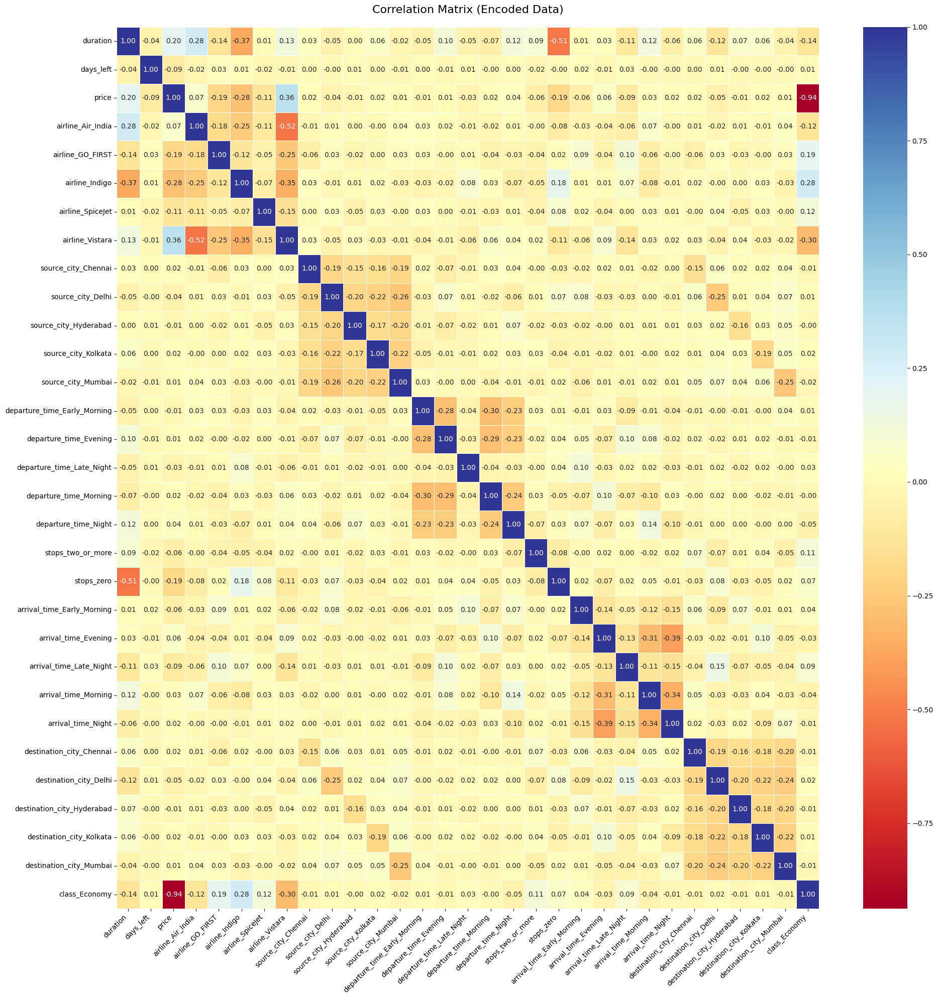

In [60]:
CleanDataset_encoded = pd.get_dummies(CleanDataset, drop_first=True,dtype=int)

correlation_matrix = CleanDataset_encoded.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap="RdYlBu", 
    fmt=".2f", 
    linewidths=0.5, 
    annot_kws={"size": 10}
)
plt.title("Correlation Matrix (Encoded Data)", fontsize=16, pad=20)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


The correlation matrix highlights important relationships between variables in the dataset. A strong negative correlation of -0.94 is observed between class and ticket price, indicating that higher-class tickets tend to have lower prices. A moderate positive correlation of 0.20 is found between duration and price, which is also supported by the negative correlation with the number of stops. Other correlations are seen between various airlines.

Variables related to departure and arrival times show minimal correlations with price, suggesting that these factors do not have a significant impact on flight costs.

**Correlation between quantitative variables**

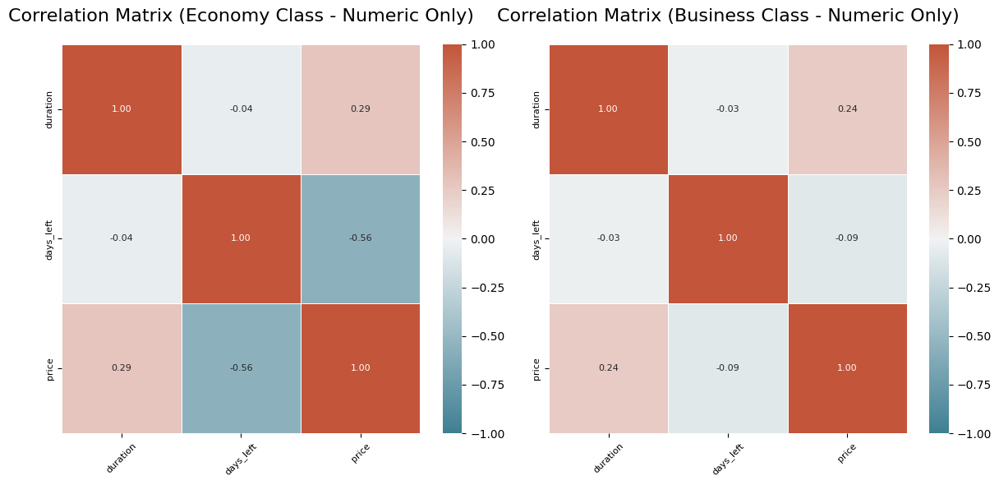

In [61]:
economy_data = CleanDataset[CleanDataset['class'] == 'Economy']
business_data = CleanDataset[CleanDataset['class'] == 'Business']

correlation_matrix_economy = economy_data.select_dtypes(include=['int64', 'float64']).corr()
correlation_matrix_business = business_data.select_dtypes(include=['int64', 'float64']).corr()

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Plot correlation matrix for Economy class
sns.heatmap(
    correlation_matrix_economy, 
    annot=True, 
    cmap=cmap, 
    vmin=-1, 
    vmax=1,
    fmt=".2f", 
    linewidths=0.5, 
    annot_kws={"size": 8},
    ax=axes[0]
)
axes[0].set_title("Correlation Matrix (Economy Class - Numeric Only)", fontsize=16, pad=20)
axes[0].tick_params(axis='x', rotation=45, labelsize=8)
axes[0].tick_params(axis='y', labelsize=8)

# Plot correlation matrix for Business class
sns.heatmap(
    correlation_matrix_business, 
    annot=True, 
    cmap=cmap, 
    vmin=-1, 
    vmax=1,
    fmt=".2f", 
    linewidths=0.5, 
    annot_kws={"size": 8},
    ax=axes[1]
)
axes[1].set_title("Correlation Matrix (Business Class - Numeric Only)", fontsize=16, pad=20)
axes[1].tick_params(axis='x', rotation=45, labelsize=8)
axes[1].tick_params(axis='y', labelsize=8)

plt.tight_layout()
plt.show()

These plots illustrate the correlation between numeric variables, separated by class.

In the economy class, there is a strong negative correlation of -0.59 between price and days left, suggesting that budget-conscious travelers tend to book economy tickets earlier to secure lower fares. Additionally, a moderate positive correlation of 0.29 is observed between duration and price, highlighting that longer flights generally have higher fares in the economy class.

**Pair Plots**

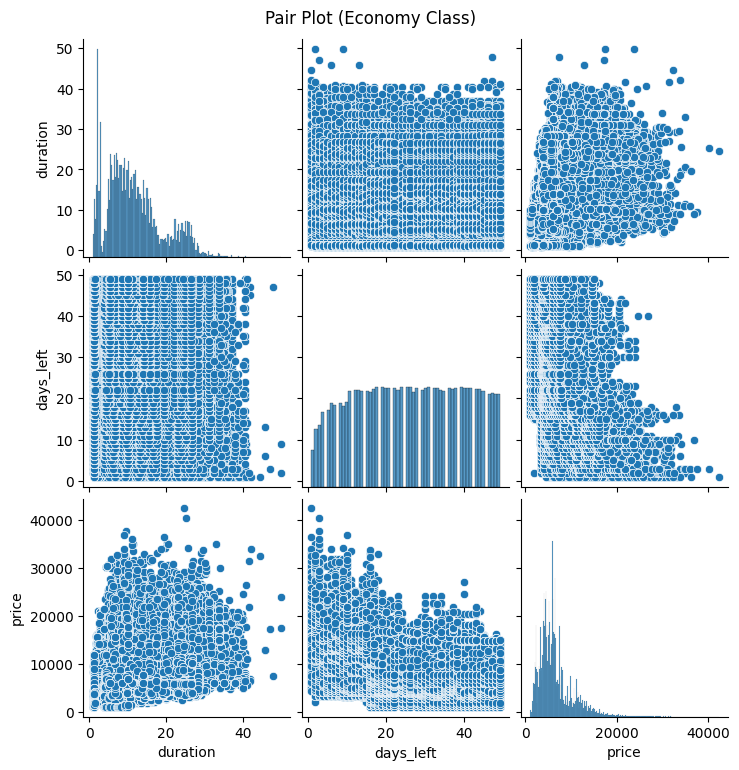

In [62]:
# Create pair plots for Economy class
sns.pairplot(economy_data)
plt.suptitle("Pair Plot (Economy Class)", y=1.02)
plt.show()

This pair plot visualizes the relationships between the numerical variables in the Economy class, with scatter plots showing pairwise comparisons between two variables, and histograms illustrating the distribution of each variable.

The distribution plots reveal that most flights have short durations, while the *days left* variable has an almost uniform distribution. A clear positive correlation between duration and flight price is visible in the scatter plot; however, there is notable variability, indicating that other factors influence prices.

As previously observed, the price tends to decrease as the number of days left approaches the departure date, stabilizing after the 20th day, which suggests a negative correlation. Additionally, there is no significant correlation between the number of days left and the flight duration.

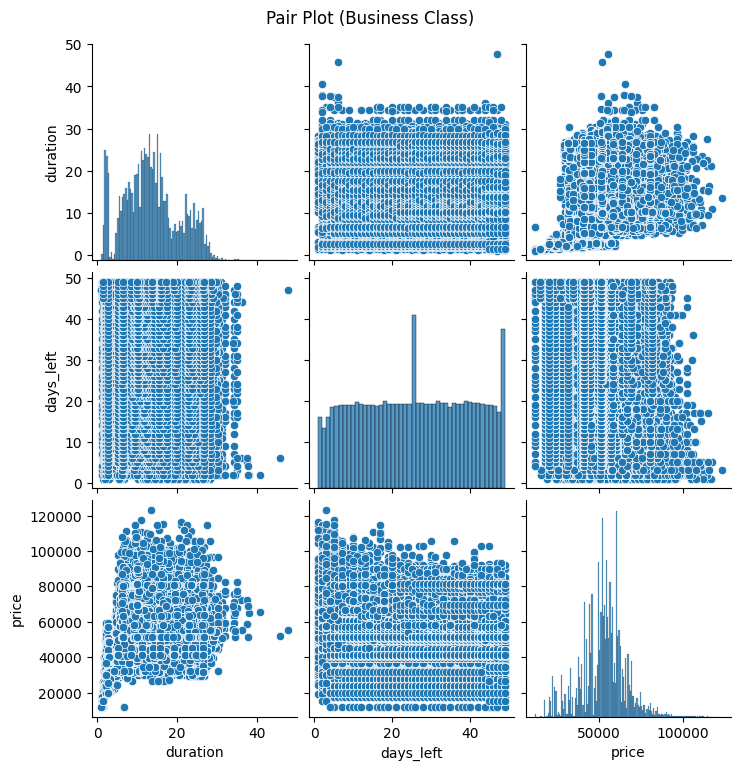

In [19]:
# Create pair plots for Business class
sns.pairplot(business_data)
plt.suptitle("Pair Plot (Business Class)", y=1.02)
plt.show()

In this pair plot, we observe similar correlations to those in the economy class. However, the negative correlation between days left and price appears to be less pronounced compared to the economy class. This suggests that, while the trend still exists, it is weaker in this case.

## Evaluation Metrics

Let us now define a set of evaluation metrics that will be useful from now on to compare the regression models we will set up on our dataset. As anticipated, these metrics are widely used in this field and allow for a comprehensive comparison, which will help us understand how to accurately predict the data.

**$R^2$**

The R-squared ($R^2$) metric, also known as the *coefficient of determination*, measures how well a regression model explains the variance in the dependent variable. It ranges from 0 to 1, where higher values indicate better model fit. The formula for $R^2$ is:

$$ R^2 = 1 - \frac{SS_{res}}{SS_{tot}} $$

where, $SS_{res}$ (residual sum of squares) represents the sum of squared differences between actual and predicted values, and $SS_{tot}$$ (total sum of squares) represents the sum of squared differences between actual values and their mean.

**Adjusted $R^2$**

The *Adjusted R-squared* ($R^2_{adj}$) is a modified version of $R^2$ that accounts for the number of predictors in a regression model, preventing overestimation of model performance. It penalizes excessive variables that do not improve the model significantly. The formula is:

$$ R^2_{adj} = 1 - \left( \frac{(1 - R^2)(n - 1)}{n - p - 1} \right) $$

where n is the number of observations, p is the number of predictors, and $R^2$ is the standard coefficient of determination. Unlike $R^2$, the adjusted version decreases if unnecessary variables are added.

**MAE**


The *Mean Absolute Error (MAE)* is a regression metric that measures the average absolute difference between actual and predicted values. It represents the model's average prediction error in the same units as the target variable. The formula for MAE is:

$$ MAE = \frac{1}{n} \sum_{i=1}^{n} | y_i - \hat{y}_i | $$

where $y_i$ are the actual values, $\hat y_i$ are the predicted values, and n is the number of observations. Lower MAE values indicate a more accurate model.

**RMSE**

The *Root Mean Squared Error (RMSE)* is a regression metric that measures the average magnitude of prediction errors while giving higher weight to larger errors due to squaring. It is useful for assessing model accuracy in the same units as the target variable. The formula for RMSE is:

$$ RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2} $$

where $y_i$ are the actual values, $\hat y_i$ are the predicted values, and n is the number of observations. Lower RMSE values indicate a more accurate model.

**MAPE**


The *Mean Absolute Percentage Error (MAPE)* is a regression metric that measures the average percentage difference between actual and predicted values. It is useful for assessing model accuracy in a scale-independent manner. The formula for MAPE is:

$$ MAPE = \frac{100}{n} \sum_{i=1}^{n} \left| \frac{y_i - \hat{y}_i}{y_i} \right| $$

where $y_i$ are the actual values, $\hat y_i$ are the predicted values, and n is the number of observations. Lower MAPE values indicate a more accurate model, but it can be problematic when actual values are close to zero.

**Function to print metrics**

We define a function that, given a set of ground-truth y and predicted y, prints MAE, RMSE, MAPE.

In [63]:
def print_metrics(y_true1, y_pred1, title):

    r2 = r2_score(y_true1, y_pred1)
    mae = mean_absolute_error(y_true1, y_pred1)
    rmse = np.sqrt(mean_squared_error(y_true1, y_pred1))
    mape = np.mean(np.abs((y_true1 - y_pred1) / y_true1)) * 100
    
    print(f"\n{title}:")
    print(f"R² test set: {r2:.3f}")
    print(f"MAE: {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")

In [64]:
def print_metrics_log(y_true_log, y_pred_log, title):

    y_true1 = np.exp(y_true_log)
    y_pred1 = np.exp(y_pred_log)

    print_metrics(y_true1, y_pred1, title)

**AIC**


The *Akaike Information Criterion (AIC)* is a statistical measure used to evaluate the quality of a model. It balances model fit and complexity, penalizing for the inclusion of unnecessary parameters. The AIC formula is:

$$ AIC = 2k - 2\ln(L) $$

where k is the number of estimated parameters in the model, L is the likelihood of the model.


**BIC**

The *Bayesian Information Criterion (BIC)* is a model selection criterion that penalizes the complexity of the model by incorporating the number of parameters and the sample size. It is similar to the AIC but imposes a stronger penalty for models with more parameters. The BIC formula is:

$$ BIC = \ln(n)k - 2\ln(L) $$

where, n is the sample size, k is the number of estimates parameters, L is the likelihood of the model.


**Diagnostic Plots and Residuals**

Diagnostic residuals are crucial for assessing the validity and appropriateness of a regression model. Analyzing residuals helps identify any patterns or inconsistencies that might suggest issues such as non-linearity or heteroscedasticity. The residuals versus fitted plot helps to check for non-linearity by visualizing if residuals are randomly scattered around zero. The Q-Q plot assesses if the residuals follow a normal distribution, which is important for inference. The scale-location plot helps detect heteroscedasticity, where the spread of residuals changes with fitted values. Lastly, the residuals versus leverage plot allows for the identification of influential data points that may disproportionately affect the model’s results, helping ensure the model is robust and reliable.

We will add 4 different plots to evaluate the performance from different perspectives of the linear regression models we are going to set up.

In [65]:
# Residuals vs Fitted
def plot_residuals_vs_fitted(model, ax):
    
    ax.scatter(model.fittedvalues, model.resid, alpha=0.7)
    ax.axhline(0, color='red', linestyle='--')
    ax.set_title("Residuals vs Fitted")
    ax.set_xlabel("Fitted Values")
    ax.set_ylabel("Residuals")

In [66]:
# Q-Q Plot
def plot_QQ_plot(model, ax):
    
    sm.qqplot(model.resid, line='45', fit=True, ax=ax)
    ax.set_title("Q-Q Plot")

In [67]:
# Scale-Location Plot
def scale_location_plot(model, ax):
    
    standardized_residuals = model.resid_pearson
    ax.scatter(model.fittedvalues, np.sqrt(np.abs(standardized_residuals)), alpha=0.7)
    ax.axhline(y=0, color='red', linestyle='--')
    ax.set_title("Scale-Location Plot")
    ax.set_xlabel("Fitted Values")
    ax.set_ylabel("√|Standardized Residuals|")

In [68]:
# Residuals vs Leverage
def plot_residuals_vs_leverages(model, ax):
    
    influence = model.get_influence()
    leverage = influence.hat_matrix_diag
    standardized_residuals = influence.resid_studentized_internal
    ax.scatter(leverage, standardized_residuals, alpha=0.7)
    ax.axhline(0, color='red', linestyle='--')
    ax.set_title('Residuals vs Leverage')
    ax.set_xlabel('Leverage')
    ax.set_ylabel('Standardized Residuals')

In [69]:
def plot_diagnostic_grid(model):
    
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    plot_residuals_vs_fitted(model, axs[0, 0])
    plot_QQ_plot(model, axs[0, 1])
    scale_location_plot(model, axs[1, 0])
    plot_residuals_vs_leverages(model, axs[1, 1])
    plt.tight_layout()
    plt.show()


**VIF**

The *Variance Inflation Factor (VIF)* is a measure used to detect multicollinearity in a regression model. It quantifies how much the variance of a regression coefficient is inflated due to correlations among predictor variables. A high VIF indicates that a variable is highly collinear with others, potentially leading to unstable estimates and reduced interpretability of the model. The VIF for a predictor $X_j$ is computed as:

$$ VIF_j = \frac{1}{1-R_j^2} $$

where $R_j^2$  is the coefficient of determination from the regression of $X_j$ on all other predictors. Typically, a VIF above 5 or 10 suggests problematic multicollinearity.

In [70]:
def calculate_vif(X):
    
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif.sort_values(by="VIF", ascending=False)

## Linear Regression and Variants: A Comparative Analysis on the Complete Model

This part of the project details the implementation of a linear regression model using various settings, such as different covariates and different splits of the data (business/economy).

Let's show the first rows of the new dataset to check the correctness:

In [71]:
CleanDataset.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
Index,,,,,,,,,,
0,SpiceJet,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


**Transform into categories**

In [72]:
# trasform into categories
CleanDataset['airline'] = CleanDataset['airline'].astype('category')
CleanDataset['source_city'] = CleanDataset['source_city'].astype('category')
CleanDataset['departure_time'] = CleanDataset['departure_time'].astype('category')
CleanDataset['stops'] = CleanDataset['stops'].astype('category')
CleanDataset['arrival_time'] = CleanDataset['arrival_time'].astype('category')
CleanDataset['destination_city'] = CleanDataset['destination_city'].astype('category')
CleanDataset['class'] = CleanDataset['class'].astype('category')

Let's set the quantitative response variable Y and the set of covariates ${x_1,...,x_p}$.
The response variable is the *price* quantity while the remaining column of the dataframe are the covariates.
Only the column flight has been excluded from the covariates.

In [73]:
y = CleanDataset['price']
X = CleanDataset.drop(columns=['price'])
X = pd.get_dummies(X, drop_first=True, dtype=int)

In [74]:
# split into train - test ( 80% - 20% )
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

In [75]:
# set the linear regression model and print the summary
linear_regression_model_complete = sm.OLS(y_train,X_train)
result_lr_complete = linear_regression_model_complete.fit()
y_pred = result_lr_complete.predict(X_test)
print(result_lr_complete.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                 8.259e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:31:03   Log-Likelihood:            -2.4578e+06
No. Observations:              240122   AIC:                         4.916e+06
Df Residuals:                  240091   BIC:                         4.916e+06
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

The presented OLS regression model examines the factors influencing flight ticket prices. As an initial approach, we included all available covariates.

Overall, the model achieves a high R-squared value of 0.912, indicating that 91.2% of the variability in prices is explained by the model. The high F-statistic further suggests that the model is statistically significant.

However, both the AIC and BIC are relatively high, which can be attributed to the large size of the dataset. This also explains why the AIC and BIC values are similar. In future models, these values will be used as benchmarks for comparison.

Notably, the coefficient for *class_Economy* (-44,930) demonstrates a significant negative impact on prices when compared to other classes. Variables such as days left, stops, and airlines also show substantial effects. Many variables are statistically significant based on their t-values (p < 0.05), although there are a few covariates that remain insignificant.

In [76]:
# Print metrics for the complete model:
y_pred_unified = result_lr_complete.predict(X_test)  # Using the fitted model
print_metrics(y_test, y_pred_unified, "Complete model - All classes")


Complete model - All classes:
R² test set: 0.911
MAE: 4583.92
RMSE: 6791.88
MAPE: 46.49%


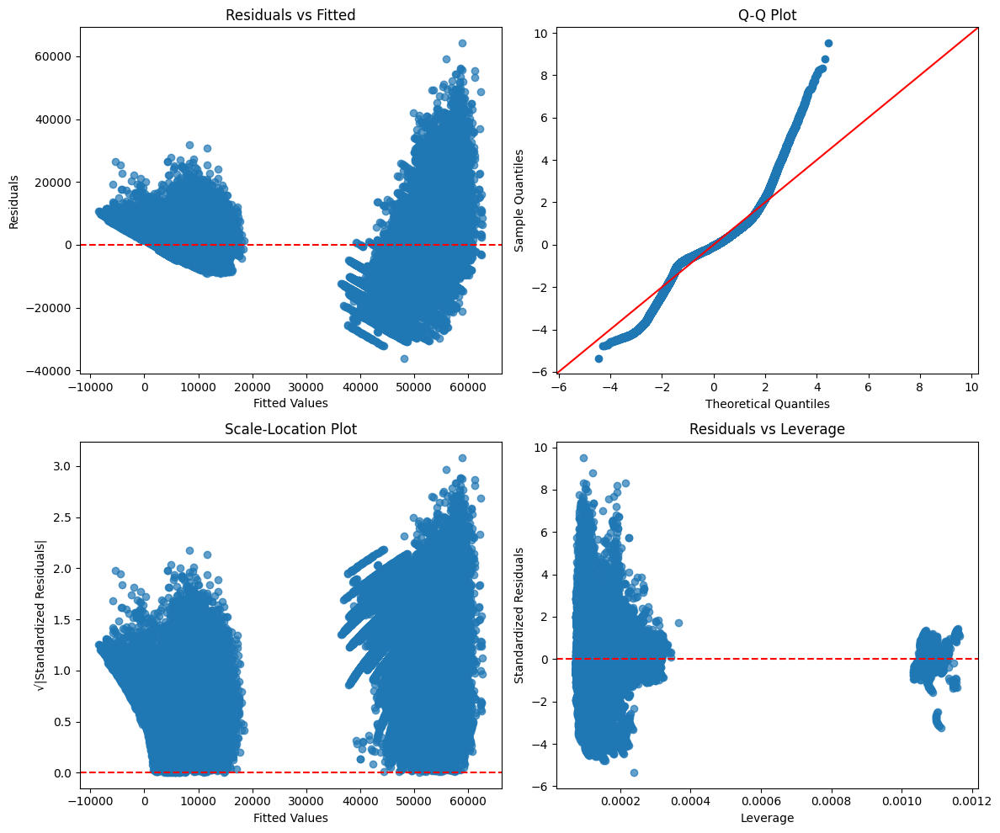

In [77]:
# plot diagnostic
plot_diagnostic_grid(result_lr_complete)

Despite the model explaining a significant amount of variability (91%), the diagnostic plots reveal several issues that need to be addressed for better model quality. By analyzing residuals, normality, variance, outliers, and influential points, we can assess the performance and potential improvements to the regression model.

* *Residuals vs. Fitted Plot*: A clear pattern in the residuals suggests heteroscedasticity and potential model misspecification. The variance of residuals increases with fitted values, indicating that the error terms are not homoscedastic, meaning the model is not adequately explaining high-value flights. A potential solution could be applying a transformation to stabilize the variance.

* *Q-Q Plot*: The residuals deviate significantly from a normal distribution, particularly at the tails, suggesting the presence of outliers and non-normality. This can affect the reliability of confidence intervals and hypothesis tests. A possible solution would be transforming the dependent variable to address the non-normality.

* *Scale-Location Plot*: The increasing trend in the plot suggests heteroscedasticity, which reinforces the conclusion from the Residuals vs. Fitted plot. One solution to address this could be using weighted least squares regression.

* *Residuals vs. Leverage Plot*: There is a cluster of high-leverage points and a wide range of values for the standardized residuals, confirming the presence of outliers. The main concern lies in the presence of points with both high leverage and high standardized residuals, indicating influential observations that may be affecting the model's accuracy. These points should be carefully examined, and remedies could include removing extreme outliers to improve model reliability.

Moreover, the diagnostic plots suggest the presence of **clusters** in the data, as observed in both the Residuals vs. Fitted and Scale-Location plots. The distinct groups of residuals and their varying variance patterns indicate that the model might be fitting two different distributions. This could be reflective of separate fare classes (Business vs. Economy), suggesting that the model may need to account for the potential differences in pricing dynamics between these classes. This could be addressed by either adding interaction terms for the different classes or fitting separate models for each group.

**VIF**

In [36]:
X_vif = X_train.drop(columns=['const'])
vif_df = calculate_vif(X_vif)
print(vif_df)

                        Variable       VIF
6                airline_Vistara  7.216439
0                       duration  6.896294
2              airline_Air_India  5.253564
1                      days_left  4.354272
29                 class_Economy  3.751841
23            arrival_time_Night  3.096994
4                 airline_Indigo  2.867385
20          arrival_time_Evening  2.819492
22          arrival_time_Morning  2.567107
13        departure_time_Evening  2.390275
15        departure_time_Morning  2.357594
12  departure_time_Early_Morning  2.269690
11            source_city_Mumbai  2.147900
28       destination_city_Mumbai  2.132630
8              source_city_Delhi  2.104534
25        destination_city_Delhi  2.075391
16          departure_time_Night  2.073581
3               airline_GO_FIRST  2.014165
27      destination_city_Kolkata  1.943416
10           source_city_Kolkata  1.863943
26    destination_city_Hyderabad  1.815829
24      destination_city_Chennai  1.785699
9          

The *Variance Inflation Factor* (VIF) measures multicollinearity, indicating how much a predictor is correlated with other covariates in the model.

The analysis reveals that no covariates have a VIF exceeding 10, suggesting that there is no high multicollinearity in the model. The majority of covariates have a VIF less than 5, indicating low multicollinearity. However, three covariates show moderate multicollinearity. Notably, the "Vistara" airline variable exhibits a high correlation with "Air India," suggesting these two covariates are correlated. Similarly, variables like "duration" and "stop zero" also show high correlation, which could indicate redundancy in the model and may need to be addressed to improve its stability.

**Considering p-values**

In [78]:
# remove features using p-value > 0.05
p_values = result_lr_complete.pvalues
threshold = 0.05
significant_vars = p_values[p_values < threshold].index
X_test = X_test[significant_vars]
X_test = sm.add_constant(X_test)
X_train = X_train[significant_vars]
X_train = sm.add_constant(X_train)


In [79]:
# set the linear regression model and print the summary 
linear_regression_model_partial1 = sm.OLS(y_train,X_train)
result_lr_partial1 = linear_regression_model_partial1.fit()
y_pred = result_lr_partial1.predict(X_test)
print(result_lr_partial1.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                 8.849e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:34:19   Log-Likelihood:            -2.4578e+06
No. Observations:              240122   AIC:                         4.916e+06
Df Residuals:                  240093   BIC:                         4.916e+06
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [80]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial1.predict(X_test)  # Using the fitted model
print_metrics(y_test, y_pred_unified, "Partial model - All classes")


Partial model - All classes:
R² test set: 0.911
MAE: 4584.58
RMSE: 6791.87
MAPE: 46.50%


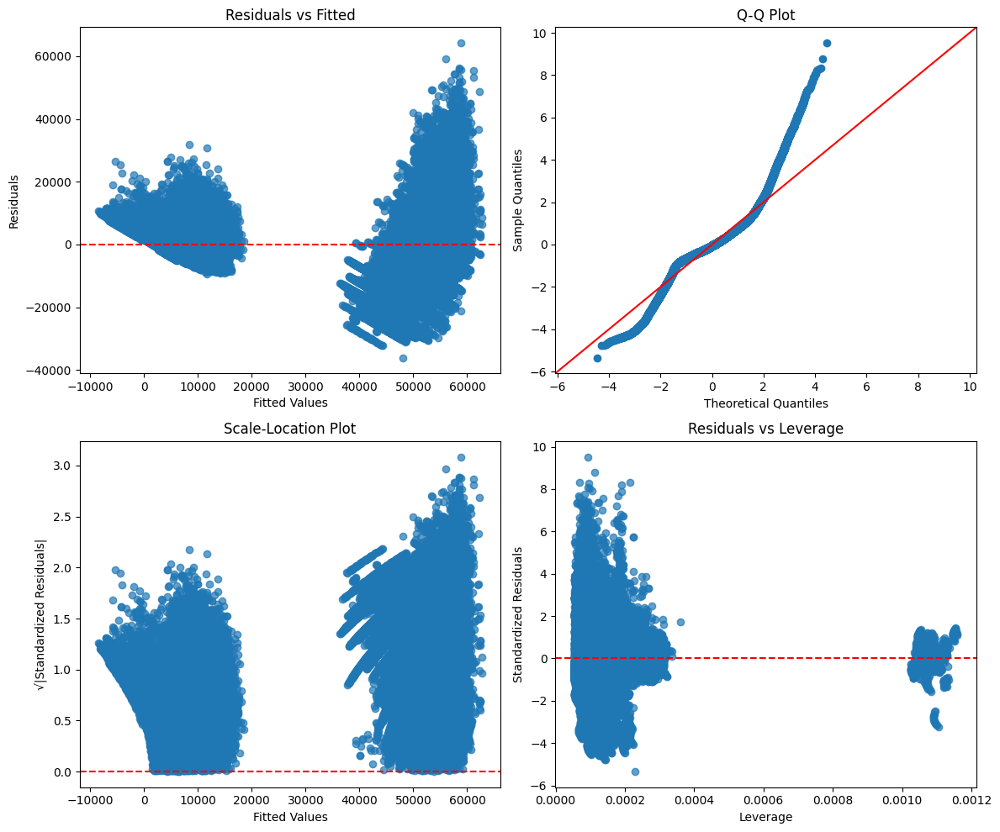

In [40]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial1)

As we can see, nothing change significatively. We need a deeper elaboration to get better results.

**Apply a trasformation to solve normality of residuals**

Now, we need to obtain normal distributed residuals, starting from the previous *Q-Q plot*. In order to achieve this result, we apply a log-trasformation to the response variable price.

In [81]:
# apply a transformation to the response variable
y_train = np.log(y_train)
y_test = np.log(y_test)
linear_regression_model_partial2 = sm.OLS(y_train,X_train)
result_lr_partial2 = linear_regression_model_partial2.fit()

print(result_lr_partial2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.915
Method:                 Least Squares   F-statistic:                 9.259e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:34:36   Log-Likelihood:                -70036.
No. Observations:              240122   AIC:                         1.401e+05
Df Residuals:                  240093   BIC:                         1.404e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

We observe that the R-squared has slightly improved, indicating that the model still explains a substantial portion of the variability in flight prices. However, the most notable improvement comes from the AIC and BIC, which have significantly decreased, suggesting a much better model fit with fewer covariates. Additionally, the Log-Likelihood has improved, indicating that the model is now better at explaining the variability in price, which further supports the model’s increased accuracy and efficiency after removing some covariates.

In [82]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial2.predict(X_test)  # Using the fitted model
print_metrics_log(y_test, y_pred_unified, "Partial model - All classes - logaritmic trasformation on price")


Partial model - All classes - logaritmic trasformation on price:
R² test set: 0.881
MAE: 4605.23
RMSE: 7833.93
MAPE: 26.19%


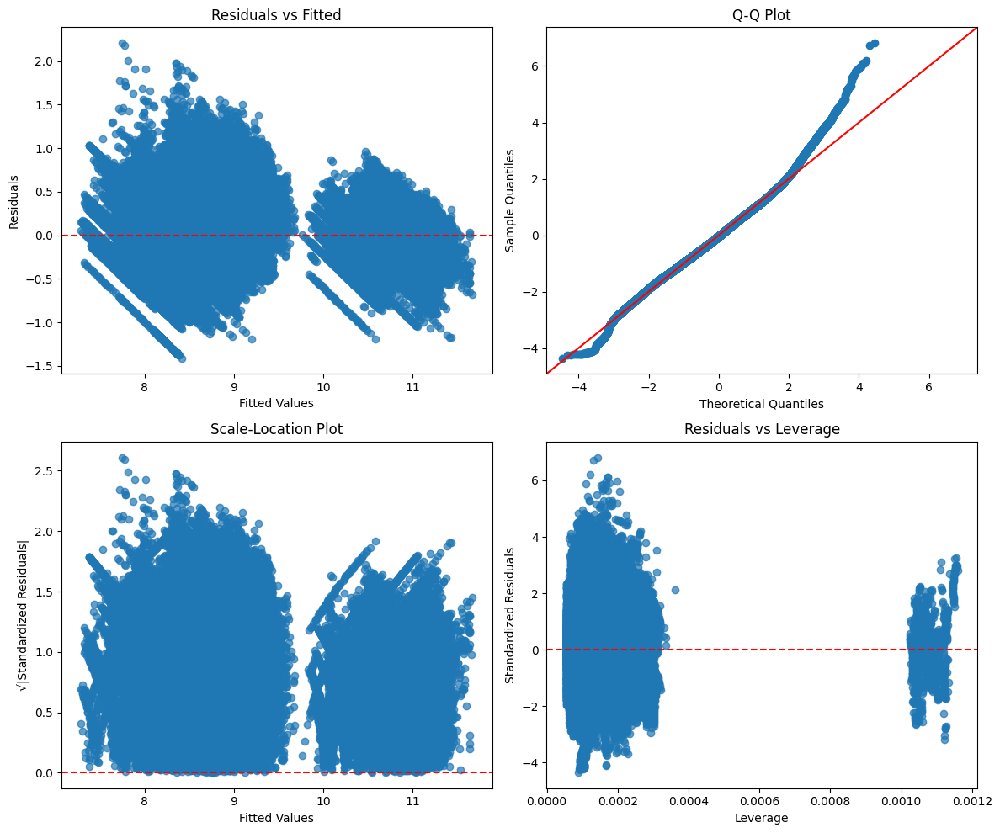

In [83]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial2)

The *Residuals vs. Fitted* plot shows that the variance of the residuals has stabilized, indicating a reduction in heteroscedasticity after the adjustments.

The *Q-Q plot* also appears improved, with the residuals aligning much better with a normal distribution. However, there is still some deviation in the extreme values, suggesting that while the transformation has helped, there is room for further improvement.

In the *Scale-Location Plot*, the variance is more evenly spread, although some non-uniformity still remains, indicating that while progress has been made, further refinements are needed.

After the log-transformation, the outliers are less spread out, but outliers are still quite frequent in the dataset. These persistent outliers continue to compromise the normality of the residuals, suggesting that additional methods may be needed to address them, such as removing extreme values or exploring different transformations.

**Adding interations and polynomial features**

In [84]:
X_train1 = X_train.drop(columns=["const"], errors="ignore")
X_test1 = X_test.drop(columns=["const"], errors="ignore")

quantitative_features = ['duration', 'days_left']
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
X_train_poly = poly.fit_transform(X_train1[quantitative_features])
X_test_poly = poly.transform(X_test1[quantitative_features])

poly_feature_names = poly.get_feature_names_out(quantitative_features)
X_train_poly_df = pd.DataFrame(X_train_poly, columns=poly_feature_names, index=X_train1.index)
X_test_poly_df = pd.DataFrame(X_test_poly, columns=poly_feature_names, index=X_test1.index)

X_train_final = X_train1.drop(columns=quantitative_features).join(X_train_poly_df)
X_test_final = X_test1.drop(columns=quantitative_features).join(X_test_poly_df)
X_train_final = sm.add_constant(X_train_final)
X_test_final = sm.add_constant(X_test_final)

polynomial_model_partial1 = sm.OLS(y_train, X_train_final)
result_pr_partial1 = polynomial_model_partial1.fit()

print(result_pr_partial1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                 9.362e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:36:30   Log-Likelihood:                -57576.
No. Observations:              240122   AIC:                         1.152e+05
Df Residuals:                  240090   BIC:                         1.155e+05
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

With the addition of squared and interaction terms for *duration* and *days left*, the R-squared has increased slightly to 0.924, indicating a modest improvement in the model's ability to explain the variability in flight prices. Additionally, both the AIC and BIC have decreased, suggesting that the new model fits the data better while maintaining parsimony.

Including these squared and interaction terms allows the model to capture more complex relationships, such as the potential non-linear effect of days left and duration on price, as well as their combined effect. These improvements in the R-squared, AIC, and BIC suggest that the model's predictive performance has enhanced, with more accurate representations of how these variables interact and contribute to the price.

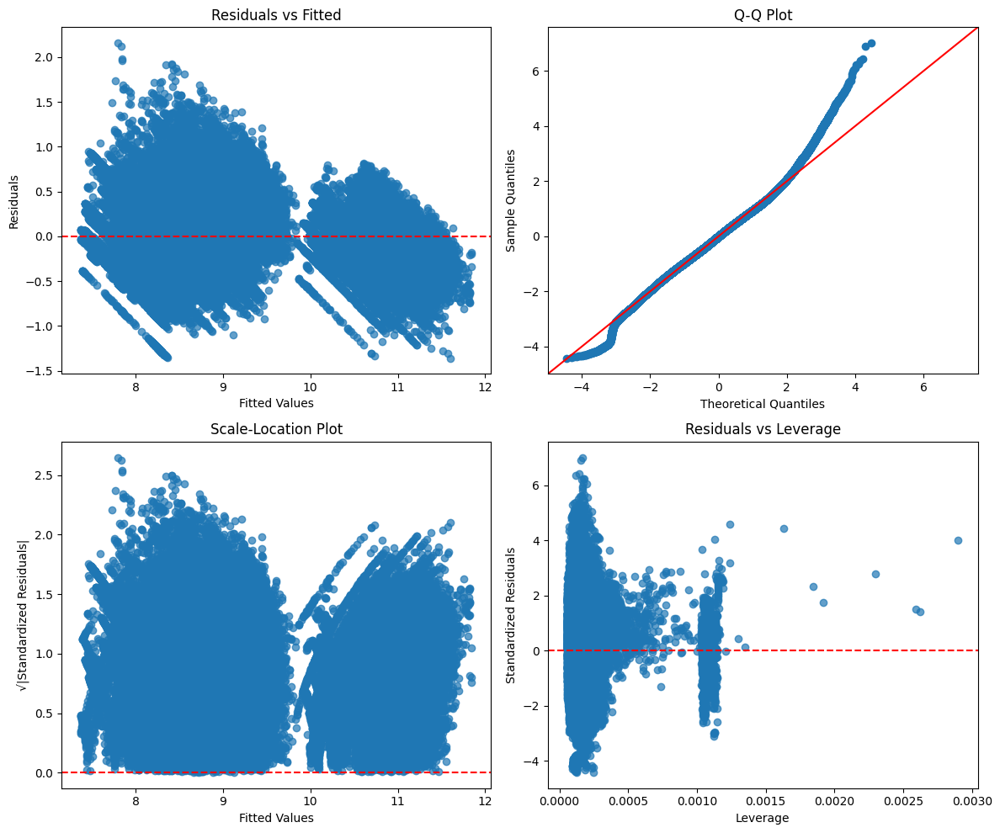

In [85]:
# plot diagnostic
plot_diagnostic_grid(result_pr_partial1)

The Variance in the residuals appears more evenly spread in the updated model, indicating some reduction in heteroscedasticity. However, the residuals do not show a significant improvement compared to the previous plot. This suggests that while the addition of squared and interaction terms has improved the model's fit and explained more variance, the residuals still exhibit some patterns that indicate room for further refinement.

In [86]:
# Print metrics for the partial model:
y_pred_unified = result_pr_partial1.predict(X_test_final)  # Using the fitted model
print_metrics_log(y_test, y_pred_unified, "Partial model - All classes - polynomial with interations")


Partial model - All classes - polynomial with interations:
R² test set: 0.860
MAE: 4716.45
RMSE: 8493.33
MAPE: 24.88%


In [87]:
X_vif = X_train_final.drop(columns=["const"])
vif_df = calculate_vif(X_vif)
print(vif_df)

                        Variable        VIF
26                      duration  95.730587
27                     days_left  80.533311
30                   days_left^2  39.863956
28                    duration^2  37.178592
29            duration days_left  14.524666
4                airline_Vistara   8.500662
0              airline_Air_India   5.858332
25                 class_Economy   3.844321
20            arrival_time_Night   3.361902
2                 airline_Indigo   3.055134
17          arrival_time_Evening   2.965205
19          arrival_time_Morning   2.802553
15                    stops_zero   2.588910
10        departure_time_Evening   2.498660
12        departure_time_Morning   2.497092
9   departure_time_Early_Morning   2.480505
13          departure_time_Night   2.249841
1               airline_GO_FIRST   2.207829
5              source_city_Delhi   1.765538
8             source_city_Mumbai   1.694053
22        destination_city_Delhi   1.639015
7            source_city_Kolkata

Indeed, with the addition of squared and interaction terms, the multicollinearity coefficients appear to have exploded. This is a common issue when incorporating polynomial and interaction features, as they can introduce strong correlations between predictors. While the model is now better able to capture non-linear relationships and more complex interactions, the trade-off is the increased multicollinearity, which can lead to unstable coefficient estimates and reduced model interpretability.

To address this issue, a regularization process, such as *Ridge regression (L2 regularization)* or *Lasso regression (L1 regularization)*, should be applied. These techniques penalize large coefficients, which can help mitigate the effects of multicollinearity and lead to a more stable and interpretable model. Regularization would help reduce overfitting by shrinking the coefficients of less important features, ultimately improving the model’s generalization ability while still capturing the underlying patterns in the data.

**Ridge Regression for multicollinearity**

In [88]:
scaler = StandardScaler()
X_train_final_scaled = scaler.fit_transform(X_train_final)
X_test_final_scaled = scaler.transform(X_test_final)

# Applying Ridge with CV
alphas = [0.01, 0.1, 1.0, 10.0, 100.0]
ridge = RidgeCV(alphas=alphas, store_cv_values=True)
ridge.fit(X_train_final_scaled, y_train)

y_train_pred = ridge.predict(X_train_final_scaled)
y_test_pred = ridge.predict(X_test_final_scaled)

print(f"Best alpha: {ridge.alpha_}")
print(f"R² Training: {r2_score(y_train, y_train_pred):.4f}")
print(f"R² Test: {r2_score(y_test, y_test_pred):.4f}")

n_train = X_train_final_scaled.shape[0]  
n_test = X_test_final_scaled.shape[0]    
k = X_train_final_scaled.shape[1]        

adj_r2_train = 1 - ((1 - r2_score(y_train, y_train_pred)) * (n_train - 1) / (n_train - k - 1))
adj_r2_test = 1 - ((1 - r2_score(y_test, y_test_pred)) * (n_test - 1) / (n_test - k - 1))

print(f"Adjusted R² Training: {adj_r2_train:.4f}")
print(f"Adjusted R² Test: {adj_r2_test:.4f}")

mse_test = mean_squared_error(y_test, y_test_pred)

n = X_test_final_scaled.shape[0]  
k = X_test_final_scaled.shape[1]  

aic = n * np.log(mse_test) + 2 * k
bic = n * np.log(mse_test) + k * np.log(n)

print(f"AIC: {aic:.2e}")
print(f"BIC: {bic:.2e}")

print_metrics_log(y_test, y_test_pred, "Partial model - All classes - polynomial with interations, adding Ridge CV")

# Print coefficients
print("Df of coefficients: \n")
ridge_coefs = pd.DataFrame({'Feature': X_train_final.columns, 'Coefficient': ridge.coef_})
print(ridge_coefs.sort_values(by="Coefficient", key=abs, ascending=False))  # sort

Best alpha: 1.0
R² Training: 0.9236
R² Test: 0.9231
Adjusted R² Training: 0.9236
Adjusted R² Test: 0.9230
AIC: -1.41e+05
BIC: -1.41e+05

Partial model - All classes - polynomial with interations, adding Ridge CV:
R² test set: 0.860
MAE: 4716.35
RMSE: 8492.98
MAPE: 24.88%
Df of coefficients: 

                         Feature  Coefficient
26                 class_Economy    -0.937544
28                     days_left    -0.645409
31                   days_left^2     0.418946
5                airline_Vistara     0.315243
1              airline_Air_India     0.228061
16                    stops_zero    -0.127687
2               airline_GO_FIRST     0.114438
3                 airline_Indigo     0.113432
29                    duration^2    -0.096734
27                      duration     0.081954
4               airline_SpiceJet     0.078082
30            duration days_left     0.065151
8            source_city_Kolkata     0.058285
15             stops_two_or_more     0.046952
25      destinat

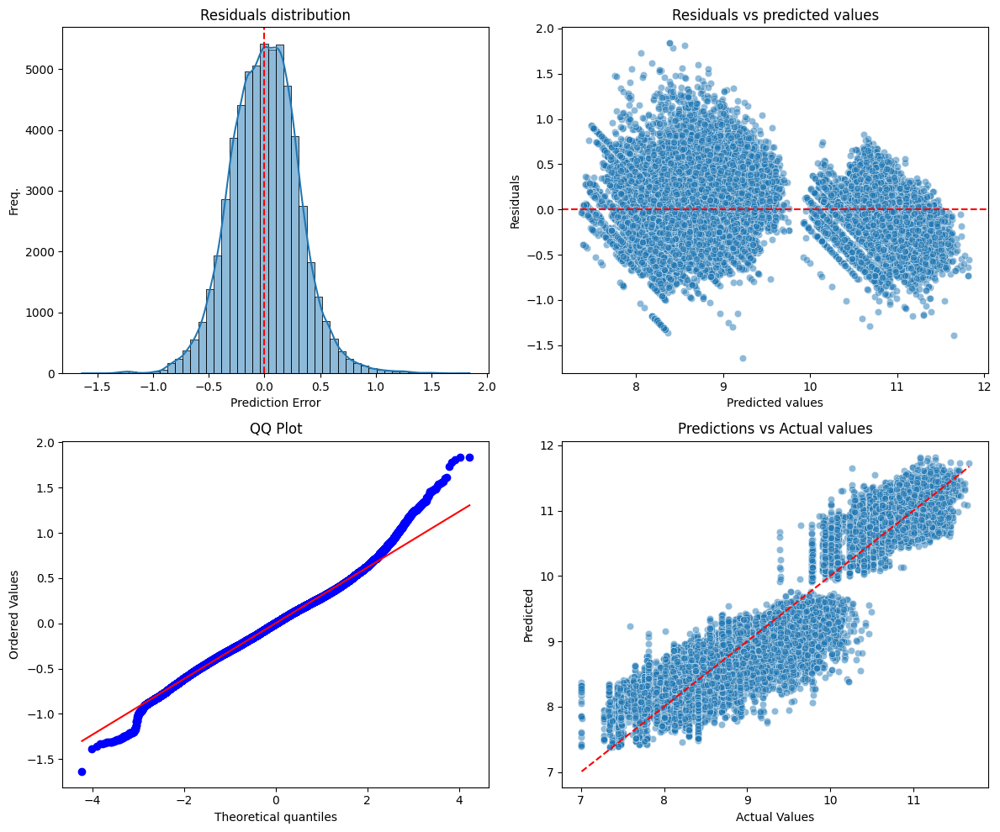

In [89]:
residuals = y_test - y_test_pred
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(residuals, kde=True, bins=50, ax=axes[0, 0])
axes[0, 0].axvline(0, color='red', linestyle='--')
axes[0, 0].set_title("Residuals distribution")
axes[0, 0].set_xlabel("Prediction Error")
axes[0, 0].set_ylabel("Freq.")

sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.5, ax=axes[0, 1])
axes[0, 1].axhline(0, color='red', linestyle='--')
axes[0, 1].set_title("Residuals vs predicted values")
axes[0, 1].set_xlabel("Predicted values")
axes[0, 1].set_ylabel("Residuals")

stats.probplot(residuals, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title("QQ Plot")

sns.scatterplot(x=y_test, y=y_test_pred, alpha=0.5, ax=axes[1, 1])
axes[1, 1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  
axes[1, 1].set_title("Predictions vs Actual values")
axes[1, 1].set_xlabel("Actual Values")
axes[1, 1].set_ylabel("Predicted")

plt.tight_layout()
plt.show()

The plots illustrate the residual analysis and prediction performance of a ridge regression model. The residuals distribution appears approximately normal with a slight skew, suggesting that the model captures most of the variance but might have some systematic bias. The residuals versus predicted values plot shows heteroscedasticity and a potential pattern. The QQ plot reveals slightly deviations from normality, especially in the tails, which suggests potential outliers. The predictions versus actual values plot highlights a strong correlation, though there are two distinct **clusters**, which could indicate an underlying categorical variable influencing the predictions. Ridge regression helps reduce multicollinearity and improves model generalization by penalizing large coefficients, leading to more stable predictions. 

Once these clusters have been observed, we modify our approach by trying to set the previous models on the two distinct classes.

## Linear Regression and Variants: A Comparative Analysis on the Splitted Models

In [90]:
# data cleaning and import
CleanDataset_economy = pd.read_csv("data/Clean_Dataset_economy.csv")
CleanDataset_business = pd.read_csv("data/Clean_Dataset_business.csv")

CleanDataset_economy = CleanDataset_economy.drop(columns=['flight'])
CleanDataset_business = CleanDataset_business.drop(columns=['flight'])

CleanDataset_economy.set_index("Unnamed: 0",inplace=True)
CleanDataset_economy.index.names = ['Index']

CleanDataset_business.set_index("Unnamed: 0",inplace=True)
CleanDataset_business.index.names = ['Index']

In [92]:
CleanDataset_economy.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,duration,days_left,price
Index,,,,,,,,,
0,SpiceJet,Delhi,Evening,zero,Night,Mumbai,2.17,1,5953
1,SpiceJet,Delhi,Early_Morning,zero,Morning,Mumbai,2.33,1,5953
2,AirAsia,Delhi,Early_Morning,zero,Early_Morning,Mumbai,2.17,1,5956
3,Vistara,Delhi,Morning,zero,Afternoon,Mumbai,2.25,1,5955
4,Vistara,Delhi,Morning,zero,Morning,Mumbai,2.33,1,5955


In [93]:
CleanDataset_business.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,duration,days_left,price
Index,,,,,,,,,
0,Air_India,Delhi,Evening,zero,Evening,Mumbai,2.00,1,25612
1,Air_India,Delhi,Evening,zero,Night,Mumbai,2.25,1,25612
2,Air_India,Delhi,Evening,one,Night,Mumbai,24.75,1,42220
3,Air_India,Delhi,Night,one,Night,Mumbai,26.50,1,44450
4,Air_India,Delhi,Evening,one,Night,Mumbai,6.67,1,46690


Once the two datasets are divided, we try to set up a **linear regression** model from them. The expected result, aims to solve the cluster problem, previously encountered.

### Economy

In [94]:
y_eco = CleanDataset_economy['price']
X_eco = CleanDataset_economy.drop(columns=['price'])
X_eco = pd.get_dummies(X_eco, drop_first=True, dtype=int)

In [95]:
# split into train - test ( 80% - 20% )
X_train_eco, X_test_eco, y_train_eco, y_test_eco = train_test_split(X_eco, y_eco, test_size=0.2, random_state=30)
X_train_eco = sm.add_constant(X_train_eco)
X_test_eco = sm.add_constant(X_test_eco)

In [96]:
# set the linear regression model and print the summary
linear_regression_model_complete_eco = sm.OLS(y_train_eco,X_train_eco)
result_lr_complete_eco = linear_regression_model_complete_eco.fit()
y_pred = result_lr_complete_eco.predict(X_test_eco)
print(result_lr_complete_eco.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.502
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     5755.
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:48:25   Log-Likelihood:            -1.5373e+06
No. Observations:              165332   AIC:                         3.075e+06
Df Residuals:                  165302   BIC:                         3.075e+06
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [97]:
# Print metrics for the complete model:
y_pred_unified_eco = result_lr_complete_eco.predict(X_test_eco)  # Using the fitted model
print_metrics(y_test_eco, y_pred_unified_eco, "Complete model - Economy")


Complete model - Economy:
R² test set: 0.510
MAE: 1893.58
RMSE: 2612.79
MAPE: 33.86%


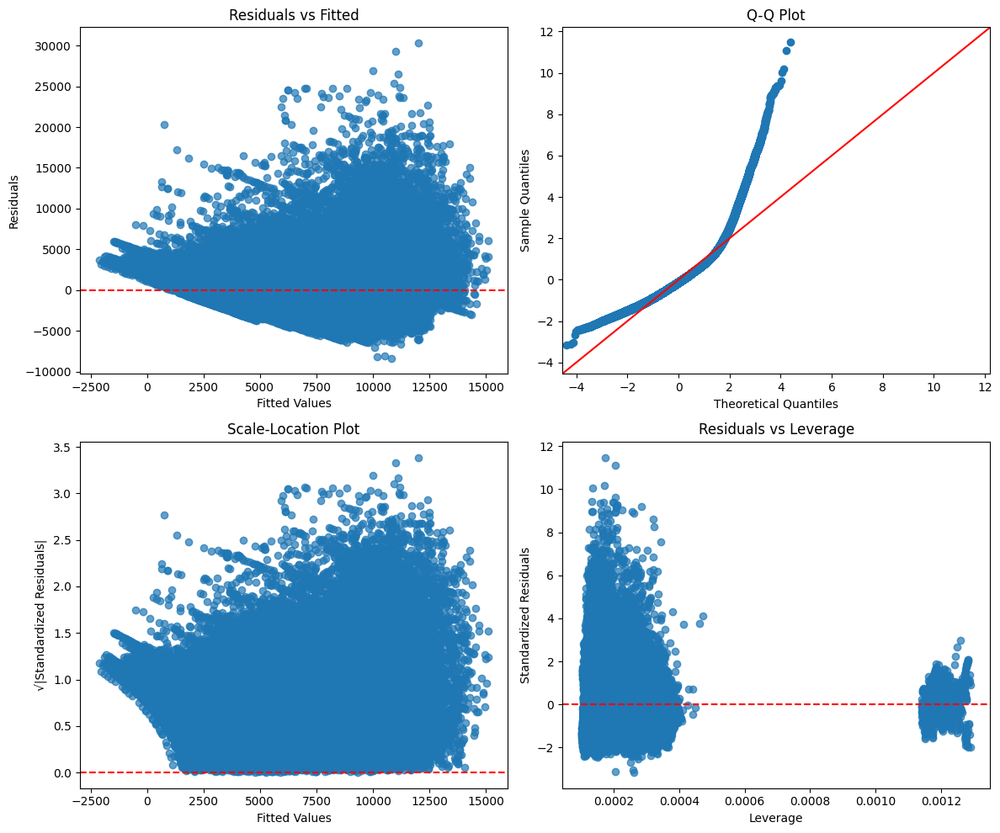

In [62]:
# plot diagnostic
plot_diagnostic_grid(result_lr_complete_eco)

In [98]:
X_vif = X_train_eco.drop(columns=['const'])
vif_df_eco = calculate_vif(X_vif)
print(vif_df_eco)

                        Variable       VIF
0                       duration  6.517009
6                airline_Vistara  4.804654
1                      days_left  4.311144
2              airline_Air_India  4.037411
4                 airline_Indigo  3.024387
23            arrival_time_Night  2.959786
20          arrival_time_Evening  2.619971
22          arrival_time_Morning  2.419013
13        departure_time_Evening  2.256800
15        departure_time_Morning  2.235076
12  departure_time_Early_Morning  2.179831
3               airline_GO_FIRST  2.089886
11            source_city_Mumbai  2.086004
28       destination_city_Mumbai  2.084726
8              source_city_Delhi  2.077278
25        destination_city_Delhi  2.070488
16          departure_time_Night  1.934731
27      destination_city_Kolkata  1.926952
10           source_city_Kolkata  1.858417
26    destination_city_Hyderabad  1.773779
24      destination_city_Chennai  1.759409
9          source_city_Hyderabad  1.729648
7          

**Applying log-trasformation and considering p-values**

In [99]:
y_train_eco = np.log(y_train_eco)
y_test_eco = np.log(y_test_eco)

In [100]:
# set the linear regression model and print the summary
linear_regression_model_partial1_eco = sm.OLS(y_train_eco,X_train_eco)
result_lr_partial1_eco = linear_regression_model_partial1_eco.fit()

# remove features using p-value > 0.05
p_values = result_lr_partial1_eco.pvalues
threshold = 0.05
significant_vars = p_values[p_values < threshold].index
X_test_eco = X_test_eco[significant_vars]
X_test_eco = sm.add_constant(X_test_eco)
X_train_eco = X_train_eco[significant_vars]
X_train_eco = sm.add_constant(X_train_eco)
linear_regression_model_partial1_eco = sm.OLS(y_train_eco,X_train_eco)
result_lr_partial1_eco = linear_regression_model_partial1_eco.fit()
y_pred = result_lr_partial1_eco.predict(X_test_eco)
print(result_lr_partial1_eco.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.588
Method:                 Least Squares   F-statistic:                     8748.
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:49:16   Log-Likelihood:                -55274.
No. Observations:              165332   AIC:                         1.106e+05
Df Residuals:                  165304   BIC:                         1.109e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [101]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial1_eco.predict(X_test_eco)  # Using the fitted model
print_metrics_log(y_test_eco, y_pred_unified, "Partial model - Economy")


Partial model - Economy:
R² test set: 0.536
MAE: 1707.51
RMSE: 2541.59
MAPE: 27.41%


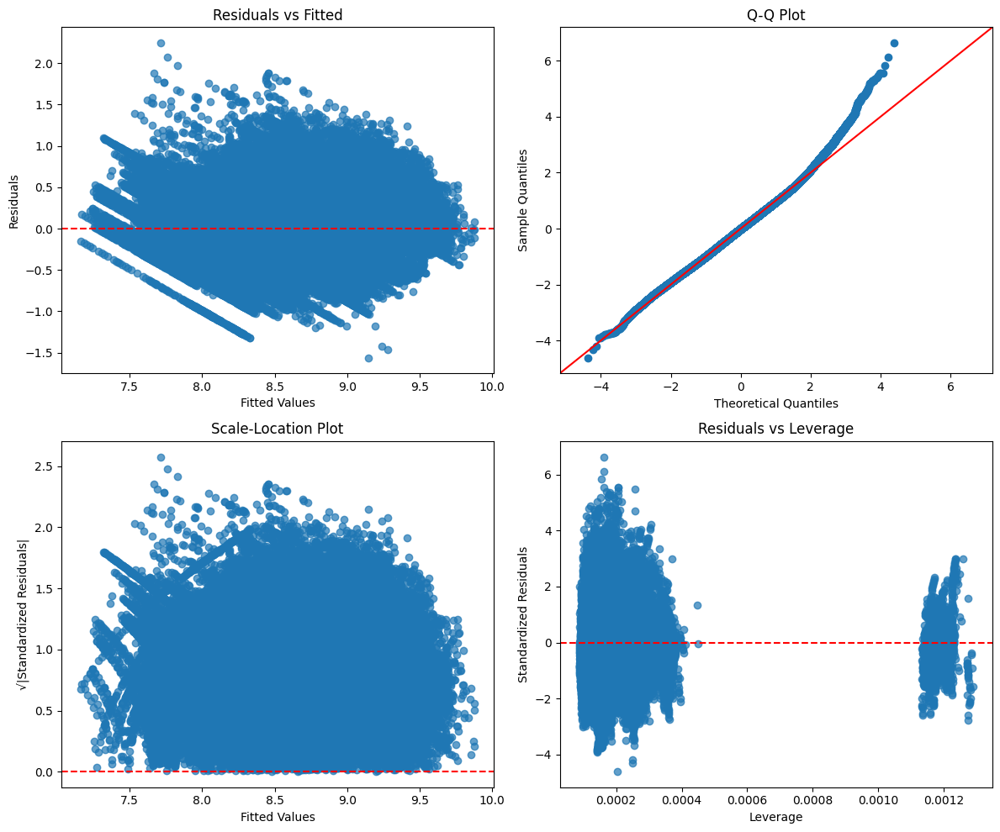

In [102]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial1_eco)

In [103]:
# identify significative variables
p_values = result_lr_partial1_eco.pvalues
threshold = 0.05
significant_vars = p_values[p_values < threshold].index

X_train_eco = X_train_eco[significant_vars]
X_test_eco = X_test_eco[significant_vars]

# Add quadratic terms
if 'duration' in X_train_eco.columns:
    X_train_eco['duration^2'] = X_train_eco['duration'] ** 2
    X_test_eco['duration^2'] = X_test_eco['duration'] ** 2

if 'days_left' in X_train_eco.columns:
    X_train_eco['days_left^2'] = X_train_eco['days_left'] ** 2
    X_test_eco['days_left^2'] = X_test_eco['days_left'] ** 2

X_train_eco = sm.add_constant(X_train_eco)
X_test_eco = sm.add_constant(X_test_eco)

linear_regression_model_partial2_eco = sm.OLS(y_train_eco, X_train_eco)
result_lr_partial2_eco = linear_regression_model_partial2_eco.fit()

print(result_lr_partial2_eco.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                 1.076e+04
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        10:49:39   Log-Likelihood:                -40968.
No. Observations:              165332   AIC:                         8.200e+04
Df Residuals:                  165302   BIC:                         8.230e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

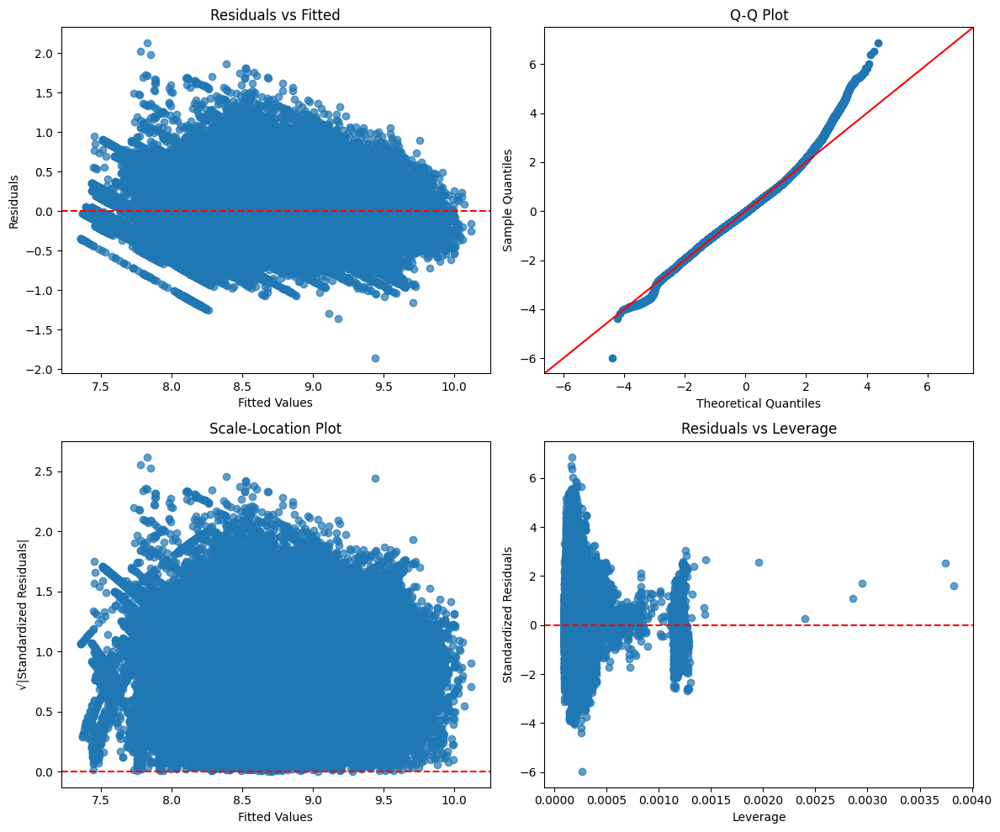

In [104]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial2_eco)

In [105]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial2_eco.predict(X_test_eco)  # Using the fitted model
print_metrics_log(y_test_eco, y_pred_unified, "Partial model - Economy")


Partial model - Economy:
R² test set: 0.610
MAE: 1540.45
RMSE: 2329.30
MAPE: 24.53%


**Ridge Regression on Economy Dataset**

In [127]:
scaler = StandardScaler()
X_train_final_scaled = scaler.fit_transform(X_train_eco)
X_test_final_scaled = scaler.transform(X_test_eco)

# applyng ridge with CV
alphas = [0.01, 0.1, 1.0, 10.0, 100.0]
ridge = RidgeCV(alphas=alphas, store_cv_values=True)
ridge.fit(X_train_final_scaled, y_train_eco)

y_train_pred = ridge.predict(X_train_final_scaled)
y_test_pred = ridge.predict(X_test_final_scaled)

print(f"Best alpha: {ridge.alpha_}")
print(f"R² Training: {r2_score(y_train_eco, y_train_pred):.4f}")
print(f"R² Test: {r2_score(y_test_eco, y_test_pred):.4f}")

mse_test = mean_squared_error(y_test_eco, y_test_pred)

n = X_test_final_scaled.shape[0]  
k = X_test_final_scaled.shape[1]  

aic = n * np.log(mse_test) + 2 * k
bic = n * np.log(mse_test) + k * np.log(n)

print(f"AIC: {aic:.2e}")
print(f"BIC: {bic:.2e}")

print_metrics_log(y_test_eco, y_test_pred, "Partial model - Economy - polynomial with interations, adding Ridge CV")

# print coefficients 
print("Df of coefficients: \n")
ridge_coefs = pd.DataFrame({'Feature': X_train_eco.columns, 'Coefficient': ridge.coef_})
print(ridge_coefs.sort_values(by="Coefficient", key=abs, ascending=False))  # sort
      

Best alpha: 0.1
R² Training: 0.6537
R² Test: 0.6600
AIC: -9.71e+04
BIC: -9.68e+04

Partial model - Economy - polynomial with interations, adding Ridge CV:
R² test set: 0.610
MAE: 1540.45
RMSE: 2329.30
MAPE: 24.53%
Df of coefficients: 

                         Feature  Coefficient
2                      days_left    -0.832751
29                   days_left^2     0.573512
7                airline_Vistara     0.288236
3              airline_Air_India     0.222318
4               airline_GO_FIRST     0.135330
5                 airline_Indigo     0.124428
19                    stops_zero    -0.119151
1                       duration     0.101263
6               airline_SpiceJet     0.087168
11           source_city_Kolkata     0.065330
28                    duration^2    -0.064982
18             stops_two_or_more     0.052384
26      destination_city_Kolkata     0.047939
25    destination_city_Hyderabad    -0.037332
10         source_city_Hyderabad    -0.028236
12            source_city_Mu

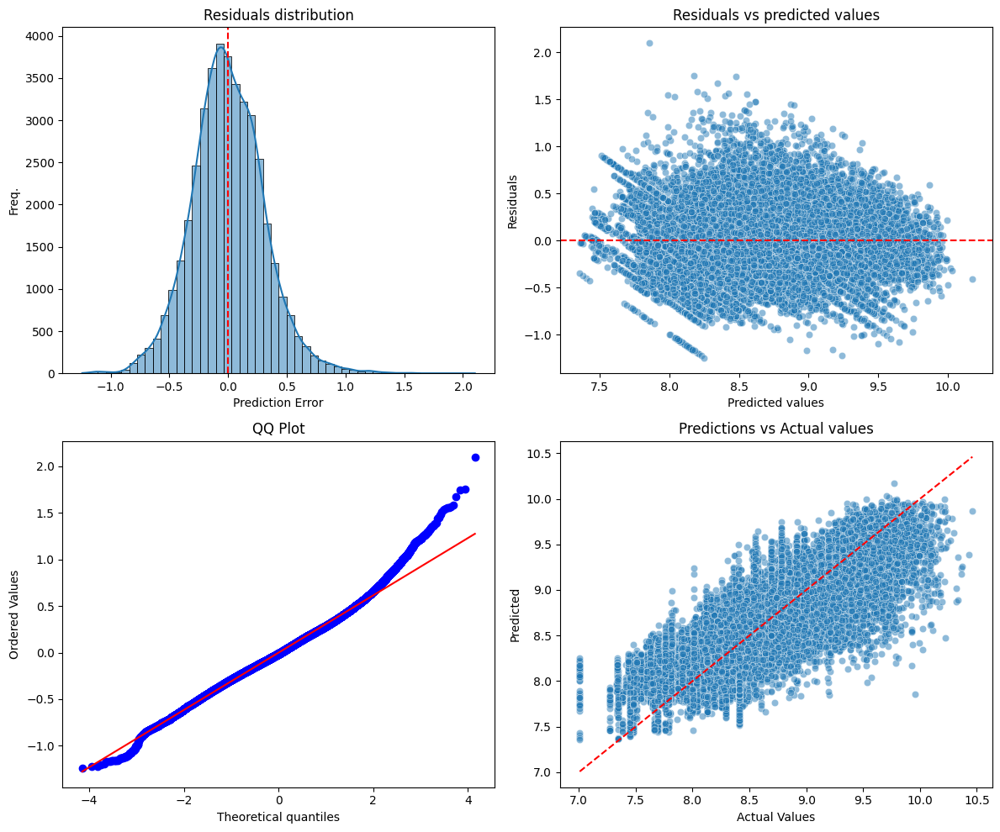

In [107]:
residuals = y_test_eco - y_test_pred
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(residuals, kde=True, bins=50, ax=axes[0, 0])
axes[0, 0].axvline(0, color='red', linestyle='--')
axes[0, 0].set_title("Residuals distribution")
axes[0, 0].set_xlabel("Prediction Error")
axes[0, 0].set_ylabel("Freq.")

sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.5, ax=axes[0, 1])
axes[0, 1].axhline(0, color='red', linestyle='--')
axes[0, 1].set_title("Residuals vs predicted values")
axes[0, 1].set_xlabel("Predicted values")
axes[0, 1].set_ylabel("Residuals")

stats.probplot(residuals, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title("QQ Plot")

sns.scatterplot(x=y_test_eco, y=y_test_pred, alpha=0.5, ax=axes[1, 1])
axes[1, 1].plot([min(y_test_eco), max(y_test_eco)], [min(y_test_eco), max(y_test_eco)], color='red', linestyle='--')  
axes[1, 1].set_title("Predictions vs Actual values")
axes[1, 1].set_xlabel("Actual Values")
axes[1, 1].set_ylabel("Predicted")

plt.tight_layout()
plt.show()

### Business

In [109]:
y_bus = CleanDataset_business['price']
X_bus = CleanDataset_business.drop(columns=['price'])
X_bus = pd.get_dummies(X_bus, drop_first=True, dtype=int)

In [110]:
# split into train - test ( 80% - 20% )
X_train_bus, X_test_bus, y_train_bus, y_test_bus = train_test_split(X_bus, y_bus, test_size=0.2, random_state=30)
X_train_bus = sm.add_constant(X_train_bus)
X_test_bus = sm.add_constant(X_test_bus)

In [111]:
# set the linear regression model and print the summary
linear_regression_model_complete_bus = sm.OLS(y_train_bus,X_train_bus)
result_lr_complete_bus = linear_regression_model_complete_bus.fit()
y_pred = result_lr_complete_bus.predict(X_test_bus)
print(result_lr_complete_bus.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.527
Model:                            OLS   Adj. R-squared:                  0.527
Method:                 Least Squares   F-statistic:                     3338.
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        11:17:28   Log-Likelihood:            -7.8648e+05
No. Observations:               74789   AIC:                         1.573e+06
Df Residuals:                   74763   BIC:                         1.573e+06
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [112]:
# Print metrics for the complete model:
y_pred_unified_bus = result_lr_complete_bus.predict(X_test_bus)  # Using the fitted model
print_metrics(y_test_bus, y_pred_unified_bus, "Complete model - Business")


Complete model - Business:
R² test set: 0.523
MAE: 6781.35
RMSE: 8897.94
MAPE: 13.97%


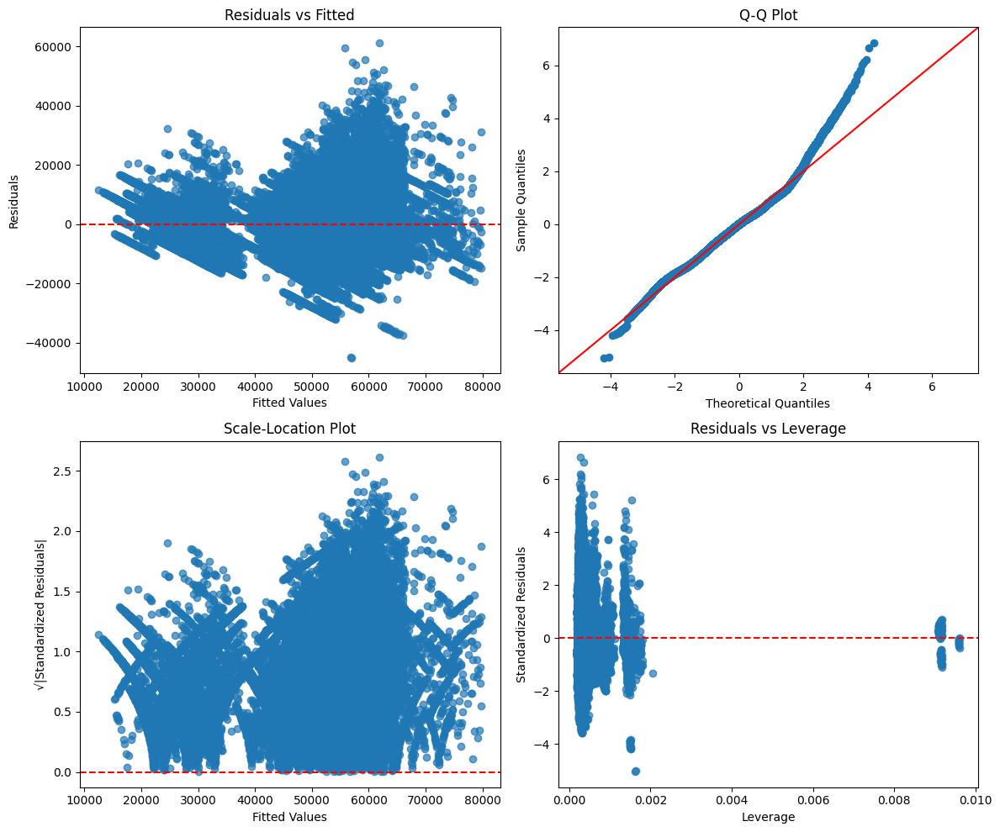

In [113]:
# plot diagnostic
plot_diagnostic_grid(result_lr_complete_bus)

In [114]:
X_vif = X_train_bus.drop(columns=['const'])
vif_df_bus = calculate_vif(X_vif)
print(vif_df_bus)

                        Variable       VIF
0                       duration  6.711775
1                      days_left  4.200920
19            arrival_time_Night  3.090587
16          arrival_time_Evening  2.988483
2                airline_Vistara  2.760867
18          arrival_time_Morning  2.668055
9         departure_time_Evening  2.621829
11        departure_time_Morning  2.426884
12          departure_time_Night  2.350786
8   departure_time_Early_Morning  2.282586
7             source_city_Mumbai  2.023047
24       destination_city_Mumbai  2.015830
4              source_city_Delhi  1.972798
23      destination_city_Kolkata  1.871643
21        destination_city_Delhi  1.865982
22    destination_city_Hyderabad  1.768885
20      destination_city_Chennai  1.763477
6            source_city_Kolkata  1.754923
5          source_city_Hyderabad  1.709504
3            source_city_Chennai  1.683999
14                    stops_zero  1.517537
15    arrival_time_Early_Morning  1.318737
17       ar

In [115]:
y_train_bus = np.log(y_train_bus)
y_test_bus = np.log(y_test_bus)

In [116]:
# set the linear regression model and print the summary
linear_regression_model_partial1_bus = sm.OLS(y_train_bus,X_train_bus)
result_lr_partial1_bus = linear_regression_model_partial1_bus.fit()

In [117]:
# remove features using p-value > 0.05
p_values = result_lr_partial1_bus.pvalues
threshold = 0.05
significant_vars = p_values[p_values < threshold].index
X_test_bus = X_test_bus[significant_vars]
X_test_bus = sm.add_constant(X_test_bus)
X_train_bus = X_train_bus[significant_vars]
X_train_bus = sm.add_constant(X_train_bus)
linear_regression_model_partial1_bus = sm.OLS(y_train_bus,X_train_bus)
result_lr_partial1_bus = linear_regression_model_partial1_bus.fit()
y_pred = result_lr_partial1_bus.predict(X_test_bus)
print(result_lr_partial1_bus.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.615
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     4972.
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        11:17:37   Log-Likelihood:                 24435.
No. Observations:               74789   AIC:                        -4.882e+04
Df Residuals:                   74764   BIC:                        -4.859e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [118]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial1_bus.predict(X_test_bus)  # Using the fitted model
print_metrics_log(y_test_bus, y_pred_unified, "Partial model - Business")


Partial model - Business:
R² test set: 0.526
MAE: 6756.89
RMSE: 8876.05
MAPE: 13.53%


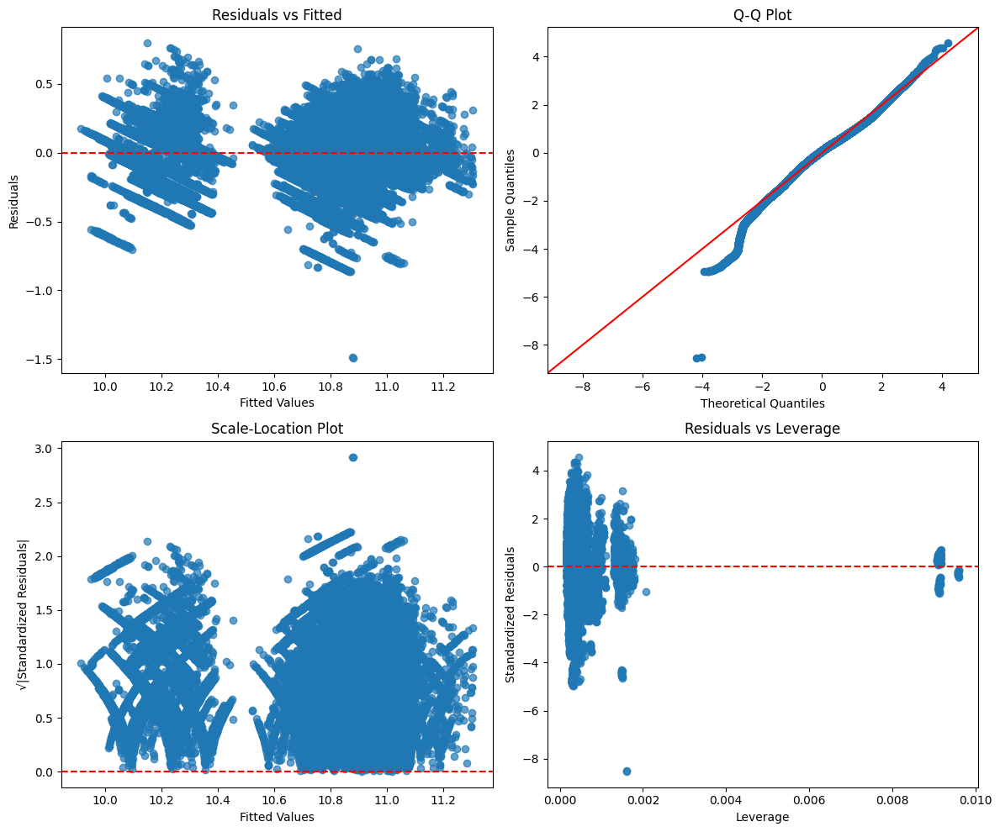

In [119]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial1_bus)

In [120]:
# identify significative variables
p_values = result_lr_partial1_bus.pvalues
threshold = 0.05
significant_vars = p_values[p_values < threshold].index

X_train_bus = X_train_bus[significant_vars]
X_test_bus = X_test_bus[significant_vars]

# Add quadratic terms
if 'duration' in X_train_bus.columns:
    X_train_bus['duration^2'] = X_train_bus['duration'] ** 2
    X_test_bus['duration^2'] = X_test_bus['duration'] ** 2

if 'days_left' in X_train_bus.columns:
    X_train_bus['days_left^2'] = X_train_bus['days_left'] ** 2
    X_test_bus['days_left^2'] = X_test_bus['days_left'] ** 2

X_train_bus = sm.add_constant(X_train_bus)
X_test_bus = sm.add_constant(X_test_bus)

linear_regression_model_partial2_bus = sm.OLS(y_train_bus, X_train_bus)
result_lr_partial2_bus = linear_regression_model_partial2_bus.fit()

print(result_lr_partial2_bus.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.630
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     4895.
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        11:17:42   Log-Likelihood:                 25936.
No. Observations:               74789   AIC:                        -5.182e+04
Df Residuals:                   74762   BIC:                        -5.157e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

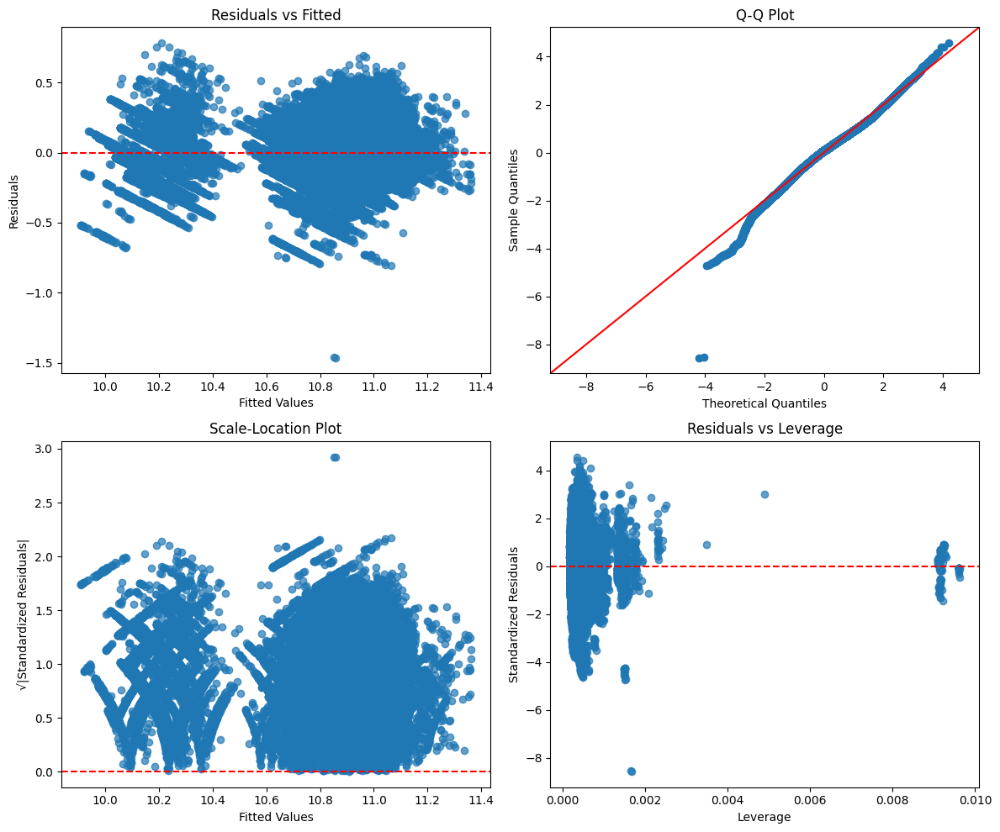

In [121]:
# plot diagnostic
plot_diagnostic_grid(result_lr_partial2_bus)

In [122]:
# Print metrics for the partial model:
y_pred_unified = result_lr_partial2_bus.predict(X_test_bus)  # Using the fitted model
print_metrics_log(y_test_bus, y_pred_unified, "Partial model - Business")


Partial model - Business:
R² test set: 0.544
MAE: 6647.06
RMSE: 8700.15
MAPE: 13.27%


**Ridge Regression for Business Dataset**

In [129]:
scaler = StandardScaler()
X_train_final_scaled = scaler.fit_transform(X_train_bus)
X_test_final_scaled = scaler.transform(X_test_bus)

# applyng ridge with CV
alphas = [0.01, 0.1, 1.0, 10.0, 100.0]
ridge = RidgeCV(alphas=alphas, store_cv_values=True)
ridge.fit(X_train_final_scaled, y_train_bus)

y_train_pred = ridge.predict(X_train_final_scaled)
y_test_pred = ridge.predict(X_test_final_scaled)

print(f"Best alpha: {ridge.alpha_}")
print(f"R² Training: {r2_score(y_train_bus, y_train_pred):.4f}")
print(f"R² Test: {r2_score(y_test_bus, y_test_pred):.4f}")

mse_test = mean_squared_error(y_test_bus, y_test_pred)

n = X_test_final_scaled.shape[0]  
k = X_test_final_scaled.shape[1]  

aic = n * np.log(mse_test) + 2 * k
bic = n * np.log(mse_test) + k * np.log(n)

print(f"AIC: {aic:.2e}")
print(f"BIC: {bic:.2e}")

print_metrics_log(y_test_bus, y_test_pred, "Partial model - Business - polynomial with interations, adding Ridge CV")

# print coefficients 
print("Df of coefficients: \n")
ridge_coefs = pd.DataFrame({'Feature': X_train_bus.columns, 'Coefficient': ridge.coef_})
print(ridge_coefs.sort_values(by="Coefficient", key=abs, ascending=False))  # sort
      

Best alpha: 1.0
R² Training: 0.6300
R² Test: 0.6281
AIC: -6.65e+04
BIC: -6.63e+04

Partial model - Business - polynomial with interations, adding Ridge CV:
R² test set: 0.544
MAE: 6647.02
RMSE: 8700.14
MAPE: 13.27%
Df of coefficients: 

                         Feature  Coefficient
1                       duration     0.179689
25                    duration^2    -0.178415
15                    stops_zero    -0.155720
2                      days_left    -0.090975
3                airline_Vistara     0.072296
26                   days_left^2     0.070499
7            source_city_Kolkata     0.027030
22    destination_city_Hyderabad    -0.026637
23      destination_city_Kolkata     0.026523
6          source_city_Hyderabad    -0.025693
20            arrival_time_Night     0.023876
14             stops_two_or_more     0.021544
21        destination_city_Delhi    -0.019832
17          arrival_time_Evening     0.017104
10        departure_time_Evening     0.016128
5              source_city_

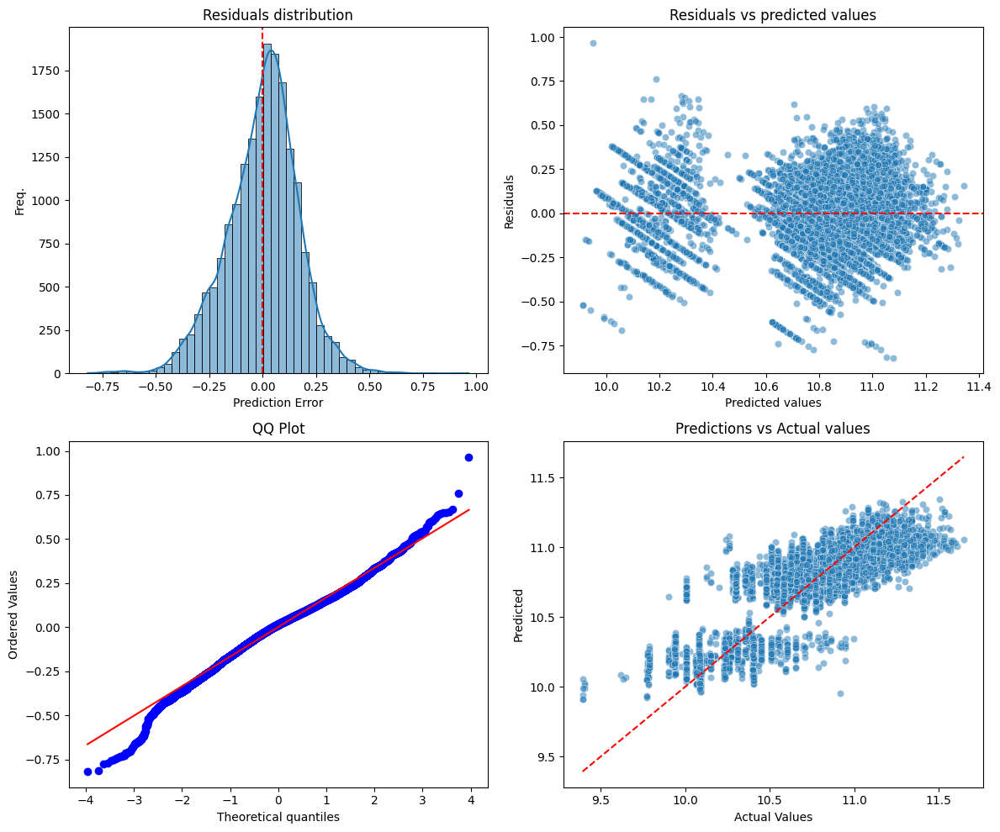

In [130]:
residuals = y_test_bus - y_test_pred
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(residuals, kde=True, bins=50, ax=axes[0, 0])
axes[0, 0].axvline(0, color='red', linestyle='--')
axes[0, 0].set_title("Residuals distribution")
axes[0, 0].set_xlabel("Prediction Error")
axes[0, 0].set_ylabel("Freq.")

sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.5, ax=axes[0, 1])
axes[0, 1].axhline(0, color='red', linestyle='--')
axes[0, 1].set_title("Residuals vs predicted values")
axes[0, 1].set_xlabel("Predicted values")
axes[0, 1].set_ylabel("Residuals")

stats.probplot(residuals, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title("QQ Plot")

sns.scatterplot(x=y_test_bus, y=y_test_pred, alpha=0.5, ax=axes[1, 1])
axes[1, 1].plot([min(y_test_bus), max(y_test_bus)], [min(y_test_bus), max(y_test_bus)], color='red', linestyle='--')  
axes[1, 1].set_title("Predictions vs Actual values")
axes[1, 1].set_xlabel("Actual Values")
axes[1, 1].set_ylabel("Predicted")

plt.tight_layout()
plt.show()

## MARS - Multivariate Adaptive Regression Spline

This part of the project, details the implementation of the **MARS - Multivariate Adaptive Regression Splines** approach for the three datasets. Similar for what was demonstrated for the other models, common metrics were calculated to compare the results. The implementation of the MARS models, are present within the `GroupM_analysis_notebook_MARS.Rmd`. For this purpose, R was used for the library *“earth”* which allows us to set up a MARS model on a train set by setting some parameters such as degree. Analogously as for the other models, some diagnostic plots have been implemented.


## Regression Trees, XGBoost and Random Forest approaches

This section of the project delves into the implementation of advanced predictive techniques, specifically *Xgboost*, *Random Forests* and *Regression Trees*. To fully harness the potential of these methods, additional evaluations will be conducted, focusing on the dataset’s structure and identifying potential splits to enhance predictive accuracy. Some metrics such as $R^2$, MAE, RMSE and MAPE will be used in order to be able to fairly compare our models.  

**Metrics and Diagnostic Plots**

As the previous part, we will introduce some common metrics and diagnostic plots to evaluate our models.

In [ ]:
# function to evaluate metrics - log
def print_metrics_tree(y_test, y_pred, title):

    y_pred = np.exp(y_pred)
    y_test = np.exp(y_test)

    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    print(f" {title} - Performance Metrics:")
    print(f" R² Score: {r2:.4f}")
    print(f" MAE: {mae:.2f}")
    print(f" RMSE: {rmse:.2f}")
    print(f" MAPE: {mape:.2f}%")
    

In [88]:
#plot diagnostic
def plot_diagnostic_trees(y_test, y_pred):

    residuals = y_test - y_pred
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # 1. Residuals vs Fitted Plot
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.5, ax=axes[0, 0])
    axes[0, 0].axhline(0, linestyle='--', color='red')
    axes[0, 0].set_xlabel("Fitted Values (Predictions)")
    axes[0, 0].set_ylabel("Residuals")
    axes[0, 0].set_title("Residuals vs Fitted")

    # 2. Q-Q Plot
    stats.probplot(residuals, dist="norm", plot=axes[0, 1])
    axes[0, 1].set_title("Q-Q Plot of Residuals")

    # 3. Histogram of Residuals
    sns.histplot(residuals, bins=30, kde=True, ax=axes[1, 0])
    axes[1, 0].set_xlabel("Residuals")
    axes[1, 0].set_title("Histogram of Residuals")

    # 4. Actual vs Predicted Plot
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.5, ax=axes[1, 1])
    axes[1, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    axes[1, 1].set_xlabel("Actual Values")
    axes[1, 1].set_ylabel("Predicted Values")
    axes[1, 1].set_title("Actual vs Predicted")

    plt.tight_layout()
    plt.show()

### Unique model

We start with the full model set on the entire dataset, exactly as in the linear regression part.

In [89]:
# read data and modify the index
CleanDataset = pd.read_csv("data/Clean_Dataset.csv")
CleanDataset.set_index("Unnamed: 0",inplace=True)
CleanDataset.index.names = ['Index']
CleanDataset = CleanDataset.drop(columns=["flight"])
CleanDataset.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
Index,,,,,,,,,,
0,SpiceJet,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


**Regression Tree**

As a first approach we use regression trees, a simple and effective regression model for predicting price. The latter variable, has already been logarithmically transformed. 

In [90]:
# pre-processing
CleanDataset = pd.get_dummies(CleanDataset, drop_first=True)

X = CleanDataset.drop(columns=["price"])
y = np.log(CleanDataset["price"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [91]:
# training the regression tree
tree_reg = DecisionTreeRegressor(random_state=30)
tree_reg.fit(X_train, y_train)

DecisionTreeRegressor(random_state=30)

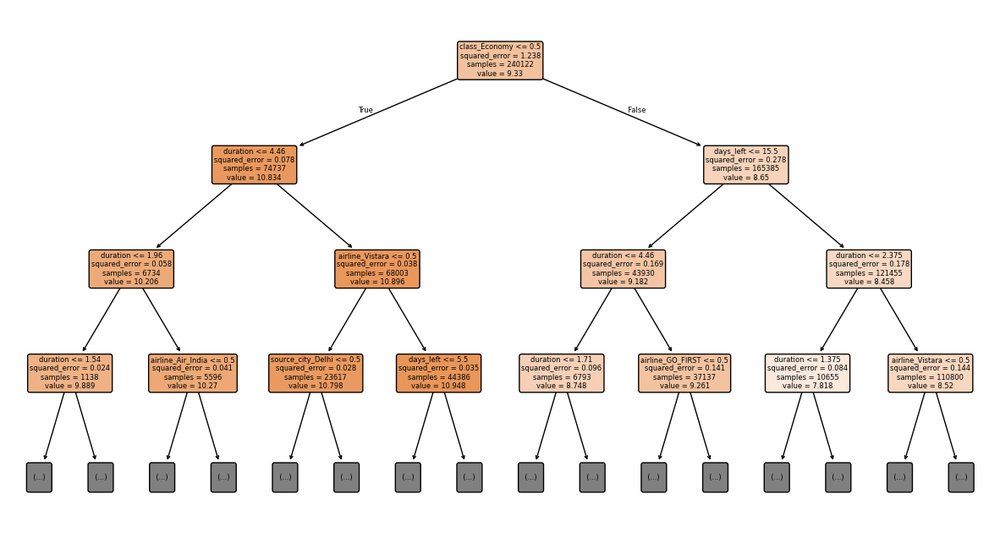

In [92]:
# Visualize the regression - tree
plt.figure(figsize=(15, 8))
plot_tree(tree_reg, feature_names=X.columns, filled=True, rounded=True, max_depth=3, fontsize=6)
plt.show()

The **regression tree** shows how various factors influence airline ticket prices, with the most significant feature being flight *class*. The root node splits based on whether the flight is in *Economy* class, showing that *Business* tickets have significantly higher prices. Flight *duration* is another key determinant, as longer flights generally lead to higher fares, with multiple splits refining this effect. *Airlines* also play a crucial role, particularly *Air India* and *Vistara*, indicating that different carriers have distinct pricing structures. The number of *days left* until departure is an important factor, as last-minute bookings tend to be more expensive. Additionally, the *departure city*, especially whether the flight originates from *Delhi*, affects the price. These features collectively determine ticket pricing, with each split in the tree reducing variance and refining predictions.

In [93]:
# evaluation
y_pred = tree_reg.predict(X_test)

print_metrics_tree(y_test, y_pred, "Regression Tree - Complete model")


 Regression Tree - Complete model - Performance Metrics:
 R² Score: 0.9760
 MAE: 1159.61
 RMSE: 3518.97
 MAPE: 7.25%


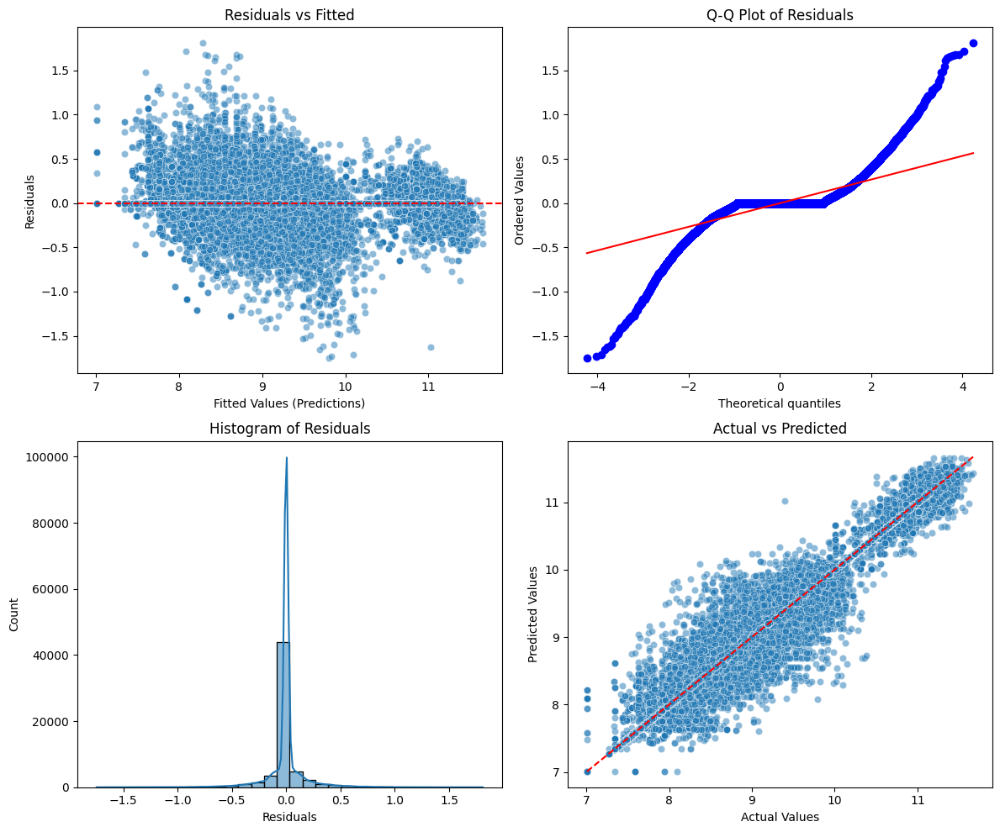

In [94]:
# plot diagnostic for regression tree
y_pred = tree_reg.predict(X_test)
plot_diagnostic_trees(y_test, y_pred)

The diagnostic plots provide valuable insights into the *Regression tree's* performance. The Residuals vs. Fitted plot shows a clear pattern, indicating that the model is not capturing some underlying structure in the data, which suggests possible heteroscedasticity or non-linearity issues. The Q-Q plot of residuals reveals deviations from normality, especially at the tails, implying that the residuals are not normally distributed. The histogram of residuals further confirms this issue, showing a sharp peak around zero and heavy tails, suggesting a high density of small residuals with some significant deviations. Lastly, the Actual vs. Predicted plot demonstrates that the model performs reasonably well in capturing the overall trend, but deviations from the diagonal line indicate some level of bias, especially for extreme values. The model may benefit from additional tuning, feature engineering, or more flexible algorithms to better capture complex relationships in the data.

**Post-Pruning of the Tree**

The results of the performance metrics related to the Regression Tree shows a good fit on the test set. $R^2$ is very good as well as MAPE and MAE. Anyway, we try to improve our model with the pruning phase. For this purpose, we will use *Xgboost* to find the best alpha and train the model with it. We will set some hyperparameters to use this library, such as `max_depth`, `learning_rate`, `n_estimators` and `num_boost_round`. This part of the notebook has been implemented using a GPU to speed up the training phase.

In [95]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# alpha values (lambda XGBoost)
#ccp_alphas = np.logspace(-5, 2, 15)  # From 10^-5 to 10^1 with 15 step - default
path = tree_reg.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = np.linspace(0, max(path.ccp_alphas), num=10)

if len(ccp_alphas) == 0:
    best_alpha = 0.0
else:
    def evaluate_alpha(alpha):
        params = {
            "tree_method": "gpu_hist",  
            "lambda": alpha,            # L2 regularization
            "objective": "reg:squarederror",
            "max_depth": 16,
            "learning_rate": 0.05,
            "n_estimators": 400,
        }
        model = xgb.train(params, dtrain, num_boost_round=400)
        y_pred_pruned = model.predict(dtest)
        return r2_score(y_test, y_pred_pruned)

    # Find best alpha
    r2_scores = [evaluate_alpha(alpha) for alpha in ccp_alphas]
    best_alpha = ccp_alphas[np.argmax(r2_scores)]

print(f"Best pruning alpha (lambda): {best_alpha:.34f}")

# Train final model with best lambda
params_final = {
    "tree_method": "gpu_hist",
    "lambda": best_alpha, 
    "objective": "reg:squarederror",
    "max_depth": 16,
    "learning_rate": 0.05,
    "n_estimators": 400,
}

final_model = xgb.train(params_final, dtrain, num_boost_round=400)

Best pruning alpha (lambda): 1.0220865009253767841101989688468166


In [96]:
# Final predictions
y_pred_final = final_model.predict(dtest)

print_metrics_tree(y_test, y_pred_final, "Regression Tree (xgboost) - Complete model")

 Regression Tree (xgboost) - Complete model - Performance Metrics:
 R² Score: 0.9880
 MAE: 1044.99
 RMSE: 2493.25
 MAPE: 6.65%


As we expected, using a series of hyperparameters, a tree pruning and regularization technique, we increased our metrics. In particular, $R^2$ reached 0.9880, MAPE has decreased to 6.65%, RMSE to 2493.25 and MAE 1044.99.

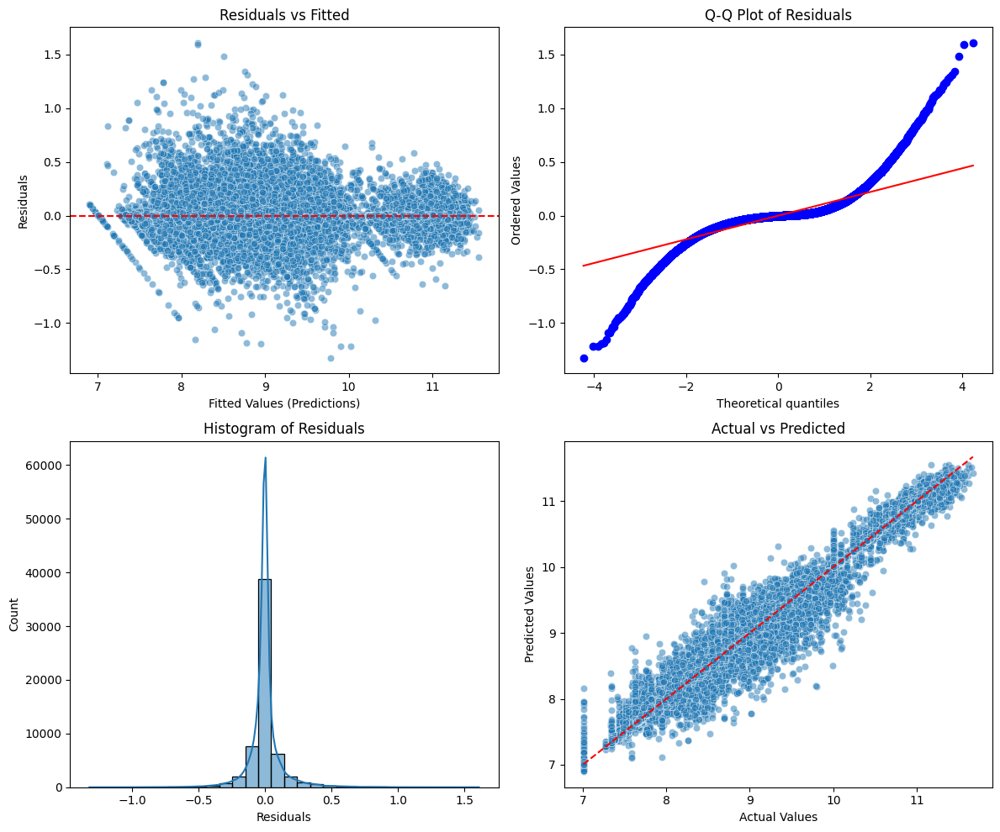

In [97]:
# plot diagnostic
dtest = xgb.DMatrix(X_test)
y_pred = final_model.predict(dtest)
plot_diagnostic_trees(y_test, y_pred)

The *XGBoost regression model* demonstrates strong predictive capabilities, as evidenced by the Actual vs Predicted plot, where the points align well with the diagonal reference line, indicating a good fit between predictions and actual values. The residuals histogram shows a distribution centered around zero, suggesting that the model's errors are mostly unbiased. However, the Residuals vs Fitted plot reveals a noticeable pattern, particularly a funnel shape, which may indicate heteroscedasticity, meaning that error variance changes with fitted values. Additionally, the Q-Q plot suggests some deviation from normality, especially at the tails, indicating that residuals do not perfectly follow a normal distribution.

**Random Forest**

Let us now try to set up a **Random Forest** model, using RandomForesRegressor from the *sklearn* library. The result we expect, compared to a Regression Tree, offers several advantages, mainly in terms of *accuracy*, *robustness* and *generalization* ability. A single Regression Tree tends to suffer from overfitting, especially if it is very deep, fitting too well to the training data and having difficulty generalizing to new data. A Random Forest, on the other hand, is an ensemble of many regression trees built on different subparts of the dataset and with random choices in the variables considered at each split. 

In [98]:
# pre-processing
X,y = CleanDataset.drop('price', axis=1), np.log(CleanDataset.price)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=30)

reg = RandomForestRegressor(n_jobs=1)
reg.fit(X_train, y_train)

RandomForestRegressor(n_jobs=1)

In [99]:
# evaluation
y_pred = reg.predict(X_test)

print_metrics_tree(y_test, y_pred, "Random Forest model - complete")


 Random Forest model - complete - Performance Metrics:
 R² Score: 0.9849
 MAE: 1057.61
 RMSE: 2792.95
 MAPE: 6.45%


We can see that the overall evaluation metrics for random forrest are very close to those obtained with xgboost. In fact, the two approaches offer much predictive ability. In the case of random forest, the training and inference time is considerably lower.

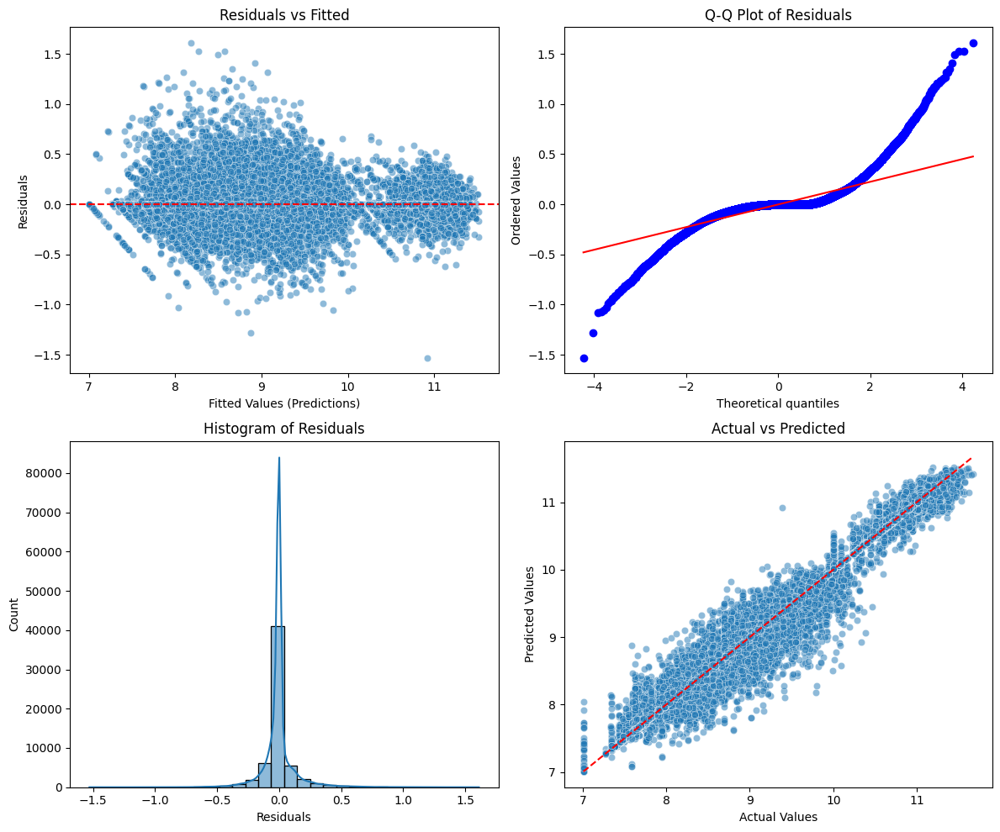

In [100]:
#plot diagnostic
y_pred = reg.predict(X_test)
plot_diagnostic_trees(y_test, y_pred)

This diagnostic plot evaluates the performance of a *Random Forest regression model*. The "Residuals vs Fitted" plot shows a funnel shape, indicating possible heteroscedasticity, meaning the variance of residuals is not constant. The Q-Q plot of residuals suggests deviations from normality, particularly at the tails, as the points deviate from the red line, indicating heavier tails than expected under a normal distribution. The histogram of residuals exhibits a sharp peak around zero, but with some asymmetry and outliers. The "Actual vs Predicted" plot demonstrates a strong linear relationship, suggesting the model captures most of the variance, though some deviation from the diagonal line suggests areas where predictions are less accurate.

**Feature Importance**

In order to perform an even deeper analysis, we inquire what is the impact of the features in the dataset on our model, through a simple and intuitive histogram.

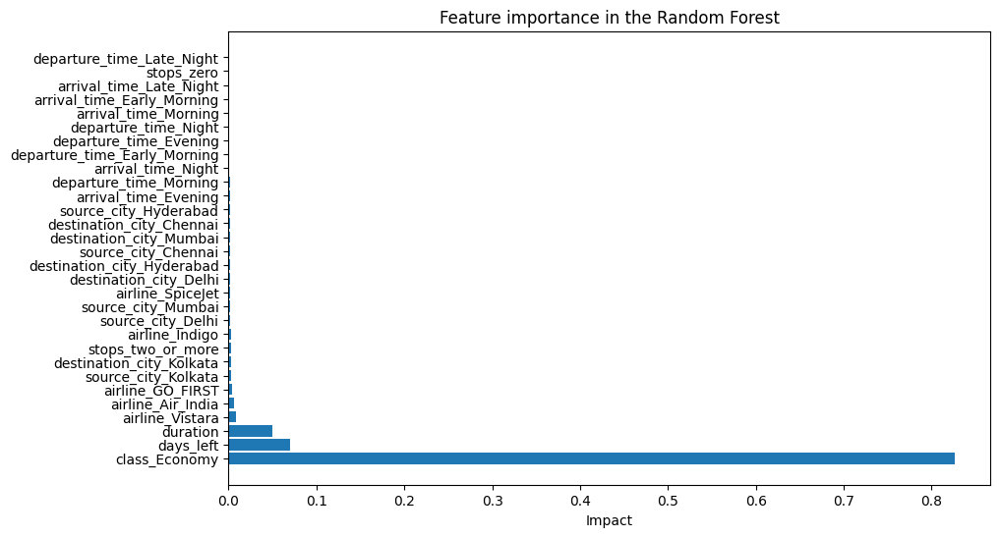

In [101]:
importances = reg.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature importance in the Random Forest")
plt.barh(range(X.shape[1]), importances[indices], align="center")
plt.yticks(range(X.shape[1]), X.columns[indices])
plt.xlabel("Impact")
plt.show()

We notice a very strong impact of *class* on the model we set up. At this point, we will use the two datasets for the distinct classes we derived earlier to conduct a more in-depth analysis.

### Economy

Once we have considered the economy dataset, we set up from it the same models used in the complete dataset in order to be able to evaluate the effectiveness and difference in predictive ability.

**Regression tree**

In [102]:
# read data and modify the index
CleanDataset_economy = pd.read_csv("data/Clean_Dataset_economy.csv")
CleanDataset_economy.set_index("Unnamed: 0",inplace=True)
CleanDataset_economy.index.names = ['Index']
CleanDataset_economy = CleanDataset_economy.drop(columns=["flight"])
CleanDataset_economy.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,duration,days_left,price
Index,,,,,,,,,
0,SpiceJet,Delhi,Evening,zero,Night,Mumbai,2.17,1,5953
1,SpiceJet,Delhi,Early_Morning,zero,Morning,Mumbai,2.33,1,5953
2,AirAsia,Delhi,Early_Morning,zero,Early_Morning,Mumbai,2.17,1,5956
3,Vistara,Delhi,Morning,zero,Afternoon,Mumbai,2.25,1,5955
4,Vistara,Delhi,Morning,zero,Morning,Mumbai,2.33,1,5955


In [103]:
# pre-processing
CleanDataset_economy = pd.get_dummies(CleanDataset_economy, drop_first=True)

X = CleanDataset_economy.drop(columns=["price"])
y = np.log(CleanDataset_economy["price"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)


In [104]:
# training the regression tree (economy)
tree_reg_eco = DecisionTreeRegressor(random_state=30)
tree_reg_eco.fit(X_train, y_train)

DecisionTreeRegressor(random_state=30)

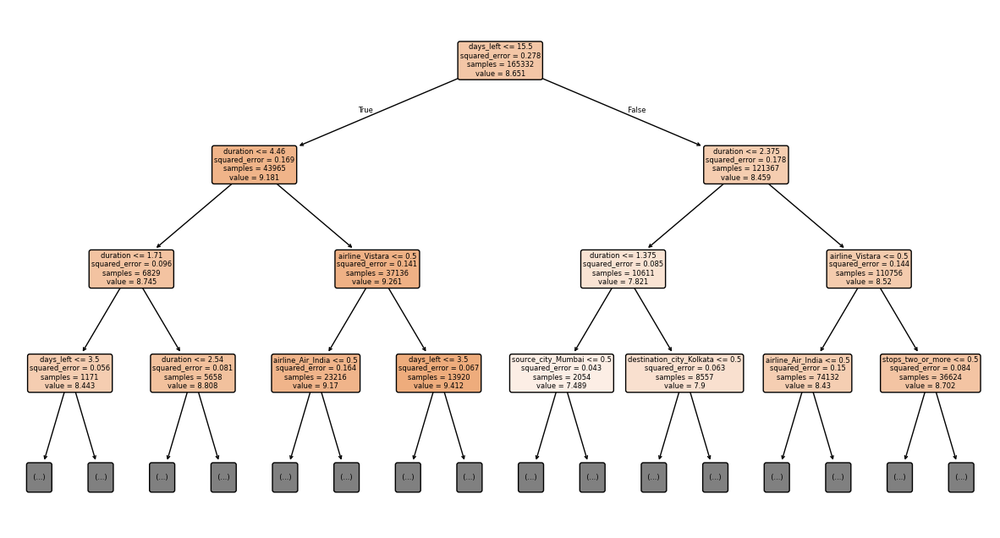

In [105]:
# Visualize the regression - tree
plt.figure(figsize=(15, 8))
plot_tree(tree_reg_eco, feature_names=X.columns, filled=True, rounded=True, max_depth=3, fontsize=6)
plt.show()

This *regression tree*, built on the "economy" dataset, predicts a continuous target variable based on features such as "duration," "days_left," "airline," and "city-related attributes." The tree starts with "days_left" as the primary splitting criterion, indicating its strong influence on the target variable. As the tree progresses, "duration" plays a significant role in further splits, suggesting that longer flights may impact the predicted value. Other important features include specific airlines like "Vistara" and "Air India," as well as departure and destination cities, reflecting their effect on the outcome. The structure of the tree highlights key relationships, with branches progressively refining predictions based on travel-related parameters.

In [106]:
# evaluation
y_pred = tree_reg_eco.predict(X_test)

print_metrics_tree(y_test, y_pred, "Regression Tree - Economy")

 Regression Tree - Economy - Performance Metrics:
 R² Score: 0.7548
 MAE: 684.08
 RMSE: 1847.83
 MAPE: 9.10%


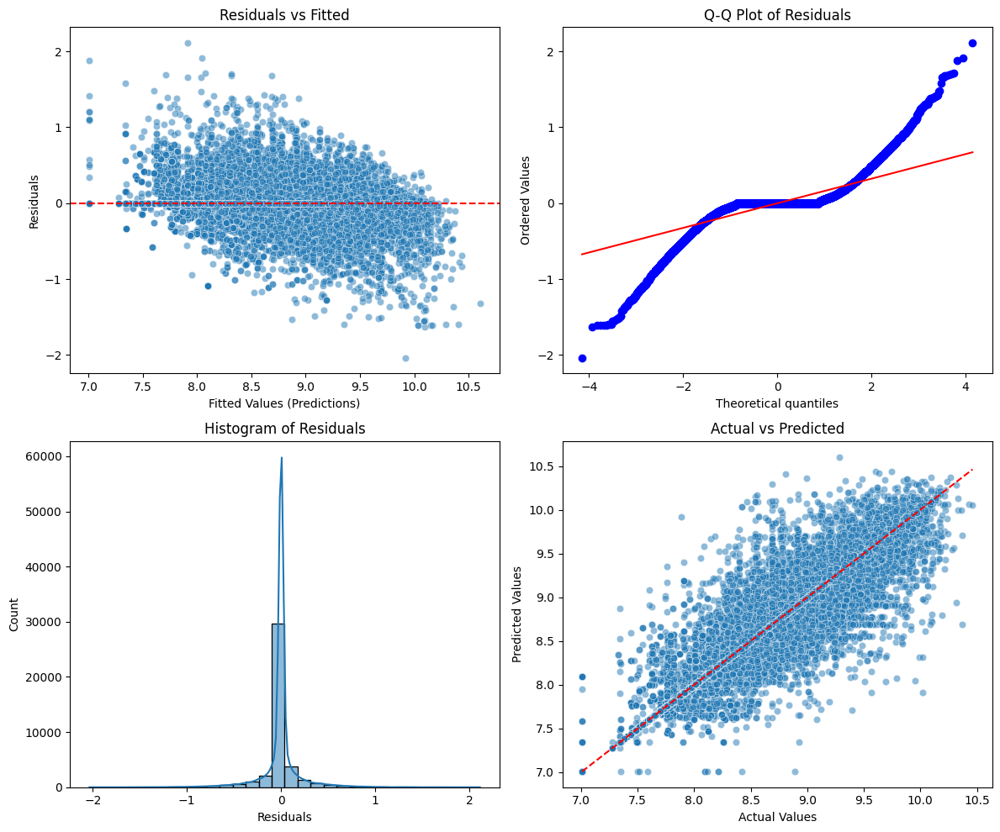

In [107]:
# plot diagnostic for regression tree
y_pred = tree_reg_eco.predict(X_test)
plot_diagnostic_trees(y_test, y_pred)

This diagnostic plot evaluates the performance of the *regression tree*. The "Residuals vs Fitted" plot shows a slight funnel shape, suggesting some heteroscedasticity, meaning the residual variance is not entirely constant across predicted values. The Q-Q plot of residuals indicates deviations from normality, particularly in the tails, where extreme values diverge from the theoretical normal distribution. The histogram of residuals shows a highly peaked distribution with a strong concentration around zero, but the presence of outliers suggests that some predictions deviate significantly from actual values. The "Actual vs Predicted" plot reveals a strong correlation between predicted and actual values, but with some dispersion, indicating areas where predictions are less accurate.

**Post-Pruning of the tree**

In a similar way, we set the XGBoost model only on the economy dataset.

In [108]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# alpha values (lambda XGBoost)
#ccp_alphas = np.logspace(-5, 2, 15)  # From 10^-5 to 10^1 with 15 step - default
path = tree_reg_eco.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = np.linspace(0, max(path.ccp_alphas), num=10)

if len(ccp_alphas) == 0:
    best_alpha = 0.0
else:
    def evaluate_alpha(alpha):
        params = {
            "tree_method": "gpu_hist",  
            "lambda": alpha,            # L2 regularization
            "objective": "reg:squarederror",
            "max_depth": 16,
            "learning_rate": 0.05,
            "n_estimators": 400,
        }
        model = xgb.train(params, dtrain, num_boost_round=400)
        y_pred_pruned = model.predict(dtest)
        return r2_score(y_test, y_pred_pruned)

    # Find best alpha
    r2_scores = [evaluate_alpha(alpha) for alpha in ccp_alphas]
    best_alpha = ccp_alphas[np.argmax(r2_scores)]

print(f"Best pruning alpha (lambda): {best_alpha:.34f}")

# Train final model with best lambda
params_final = {
    "tree_method": "gpu_hist",
    "lambda": best_alpha, 
    "objective": "reg:squarederror",
    "max_depth": 16,
    "learning_rate": 0.05,
    "n_estimators": 400,
}

final_model_eco = xgb.train(params_final, dtrain, num_boost_round=400)

Best pruning alpha (lambda): 0.1017327115966167316862822644907283


In [109]:
# Final predictions
y_pred_final = final_model_eco.predict(dtest)

print_metrics_tree(y_test, y_pred_final, "Regression Tree (xgboost) - Economy")

 Regression Tree (xgboost) - Economy - Performance Metrics:
 R² Score: 0.8613
 MAE: 601.85
 RMSE: 1389.66
 MAPE: 8.18%


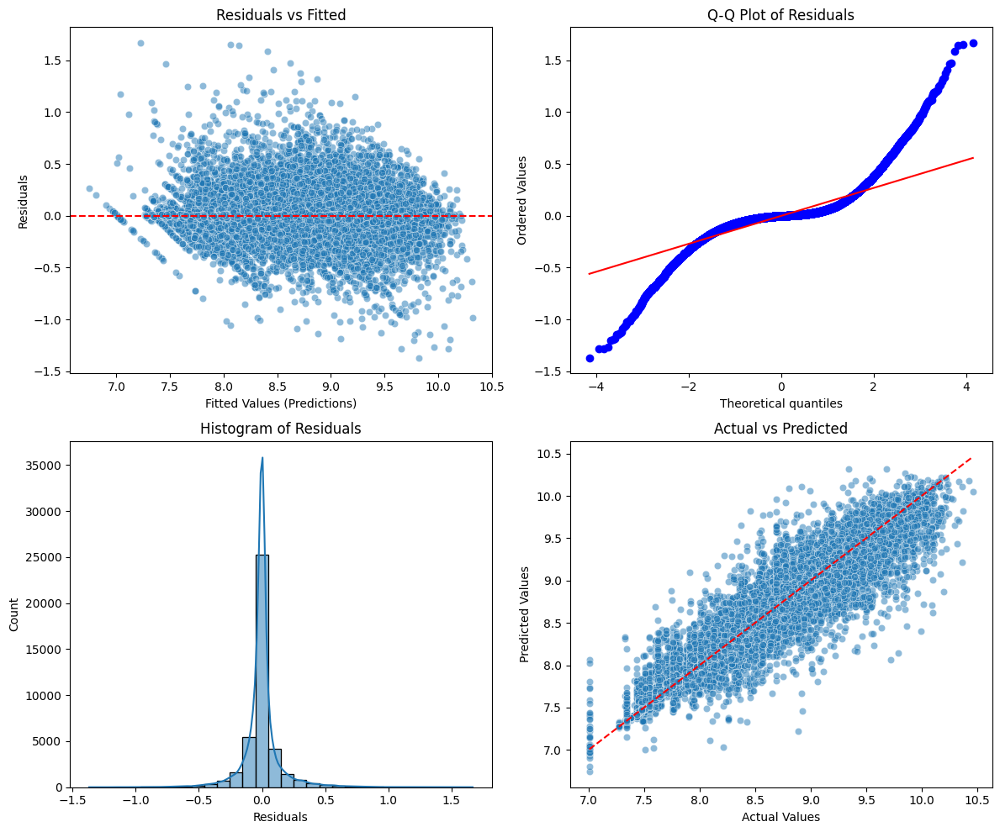

In [110]:
# plot diagnostic
dtest = xgb.DMatrix(X_test)
y_pred = final_model_eco.predict(dtest)
plot_diagnostic_trees(y_test, y_pred)

Diagnostic plots shows an analogous trend as the one descripted before.

**Random Forest**

Lastly, we set a *Random Forest* model and we observe the results.

In [111]:
# pre-processing
X,y = CleanDataset_economy.drop('price', axis=1), np.log(CleanDataset_economy.price)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=30)

reg_eco = RandomForestRegressor(n_jobs=1)
reg_eco.fit(X_train, y_train)

RandomForestRegressor(n_jobs=1)

In [112]:
# evaluation
y_pred = reg_eco.predict(X_test)

print_metrics_tree(y_test, y_pred, "Random Forest model - Economy")

 Random Forest model - Economy - Performance Metrics:
 R² Score: 0.8649
 MAE: 588.42
 RMSE: 1371.26
 MAPE: 7.77%


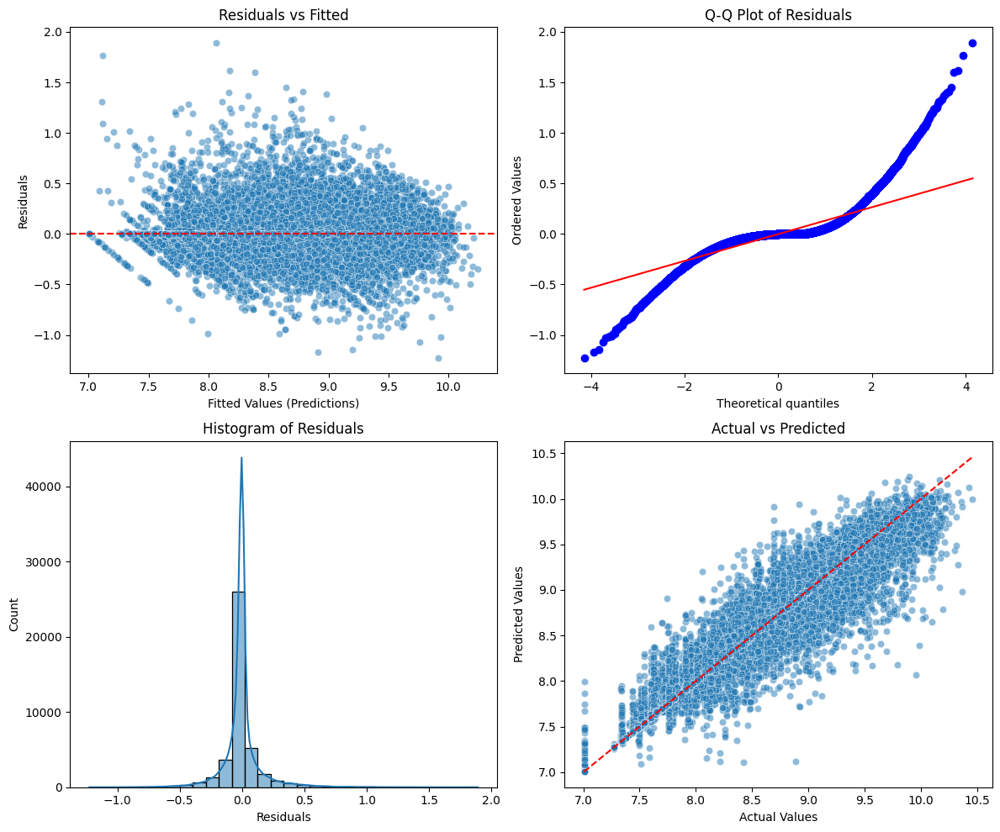

In [113]:
#plot diagnostic
y_pred = reg_eco.predict(X_test)
plot_diagnostic_trees(y_test, y_pred)

The diagnostic plots illustrate the performance of the regression model by analyzing residual behavior and prediction accuracy. The residuals vs. fitted values plot shows a fairly random distribution, but with some structure, suggesting potential model misspecification or heteroscedasticity. The Q-Q plot of residuals indicates deviations from normality, particularly in the tails, which may imply the presence of outliers or a non-normal error distribution. The histogram of residuals reveals a sharp peak around zero with a high concentration of small errors. The actual vs. predicted values plot demonstrates a strong correlation, but with some dispersion around the diagonal, suggesting that while the model captures the trend, it may not be perfectly accurate for all observations.

### Business

Once we have considered the business dataset, we set up from it the same models used in the full dataset in order to be able to evaluate the effectiveness and difference in predictive ability.

**Regression Tree**

In [114]:
# read data and modify the index
CleanDataset_business = pd.read_csv("data/Clean_Dataset_business.csv")
CleanDataset_business.set_index("Unnamed: 0",inplace=True)
CleanDataset_business.index.names = ['Index']
CleanDataset_business = CleanDataset_business.drop(columns=["flight"])
CleanDataset_business.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,duration,days_left,price
Index,,,,,,,,,
0,Air_India,Delhi,Evening,zero,Evening,Mumbai,2.00,1,25612
1,Air_India,Delhi,Evening,zero,Night,Mumbai,2.25,1,25612
2,Air_India,Delhi,Evening,one,Night,Mumbai,24.75,1,42220
3,Air_India,Delhi,Night,one,Night,Mumbai,26.50,1,44450
4,Air_India,Delhi,Evening,one,Night,Mumbai,6.67,1,46690


In [115]:
# pre-processing
CleanDataset_business = pd.get_dummies(CleanDataset_business, drop_first=True)

X = CleanDataset_business.drop(columns=["price"])
y = np.log(CleanDataset_business["price"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [116]:
# training the regression tree (business)
tree_reg_bus = DecisionTreeRegressor(random_state=30)
tree_reg_bus.fit(X_train, y_train)

DecisionTreeRegressor(random_state=30)

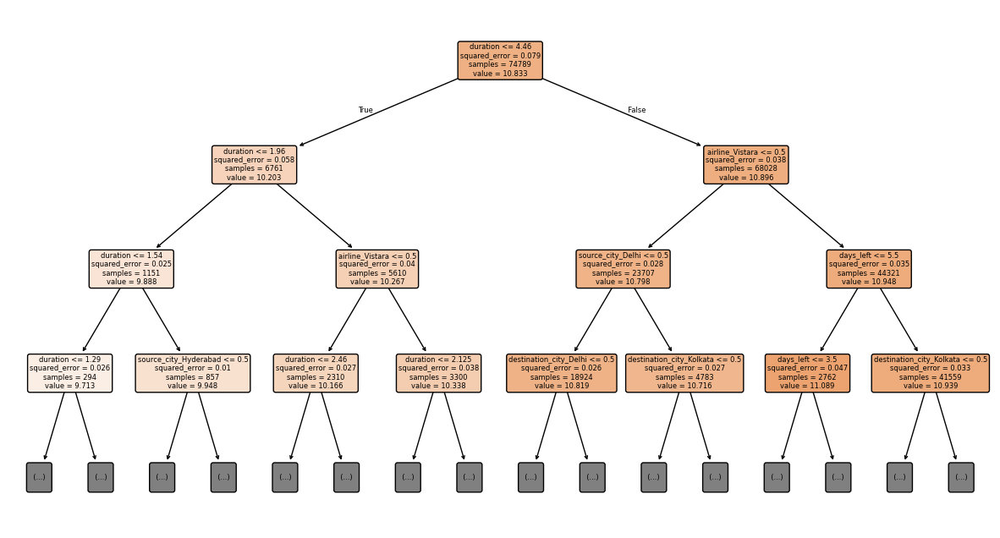

In [117]:
# Visualize the regression - tree
plt.figure(figsize=(15, 8))
plot_tree(tree_reg_bus, feature_names=X.columns, filled=True, rounded=True, max_depth=3, fontsize=6)
plt.show()

The output represents a *regression tree* trained on a business-related dataset, predicting a numerical outcome based on various features. The tree splits data at each node based on conditions (e.g., flight duration, airline, source city, destination city, and days left). Each split minimizes the squared error, leading to more refined predictions in the leaf nodes. The root node starts with the most impactful feature (duration), and subsequent nodes refine the prediction by considering additional variables. The values in each node represent the average prediction within that segment, helping in understanding how different factors influence the target variable.

In [118]:
# evaluation
y_pred = tree_reg_bus.predict(X_test)

print_metrics_tree(y_test, y_pred, "Regression Tree - Business")

 Regression Tree - Business - Performance Metrics:
 R² Score: 0.8084
 MAE: 2264.54
 RMSE: 5641.60
 MAPE: 3.90%


Metrics for business dataset are very good, reaching 3.90% MAPE.

**Post-Pruning of the Tree**

In [119]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# alpha values (lambda XGBoost)
#ccp_alphas = np.logspace(-5, 2, 15)  # From 10^-5 to 10^1 with 15 step - default
path = tree_reg_bus.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = np.linspace(0, max(path.ccp_alphas), num=10)

if len(ccp_alphas) == 0:
    best_alpha = 0.0
else:
    def evaluate_alpha(alpha):
        params = {
            "tree_method": "gpu_hist",  
            "lambda": alpha,            # L2 regularization
            "objective": "reg:squarederror",
            "max_depth": 16,
            "learning_rate": 0.05,
            "n_estimators": 400,
        }
        model = xgb.train(params, dtrain, num_boost_round=400)
        y_pred_pruned = model.predict(dtest)
        return r2_score(y_test, y_pred_pruned)

    # Find best alpha
    r2_scores = [evaluate_alpha(alpha) for alpha in ccp_alphas]
    best_alpha = ccp_alphas[np.argmax(r2_scores)]

print(f"Best pruning alpha (lambda): {best_alpha:.34f}")

# Train final model with best lambda
params_final = {
    "tree_method": "gpu_hist",
    "lambda": best_alpha, 
    "objective": "reg:squarederror",
    "max_depth": 16,
    "learning_rate": 0.05,
    "n_estimators": 400,
}

final_model_bus = xgb.train(params_final, dtrain, num_boost_round=400)

Best pruning alpha (lambda): 0.0395145395259307932733783275125461


In [120]:
# Final predictions
y_pred_final = final_model_bus.predict(dtest)

print_metrics_tree(y_test, y_pred_final, "Regression Tree (xgboost) - Business")

 Regression Tree (xgboost) - Business - Performance Metrics:
 R² Score: 0.8743
 MAE: 2130.04
 RMSE: 4569.41
 MAPE: 3.74%


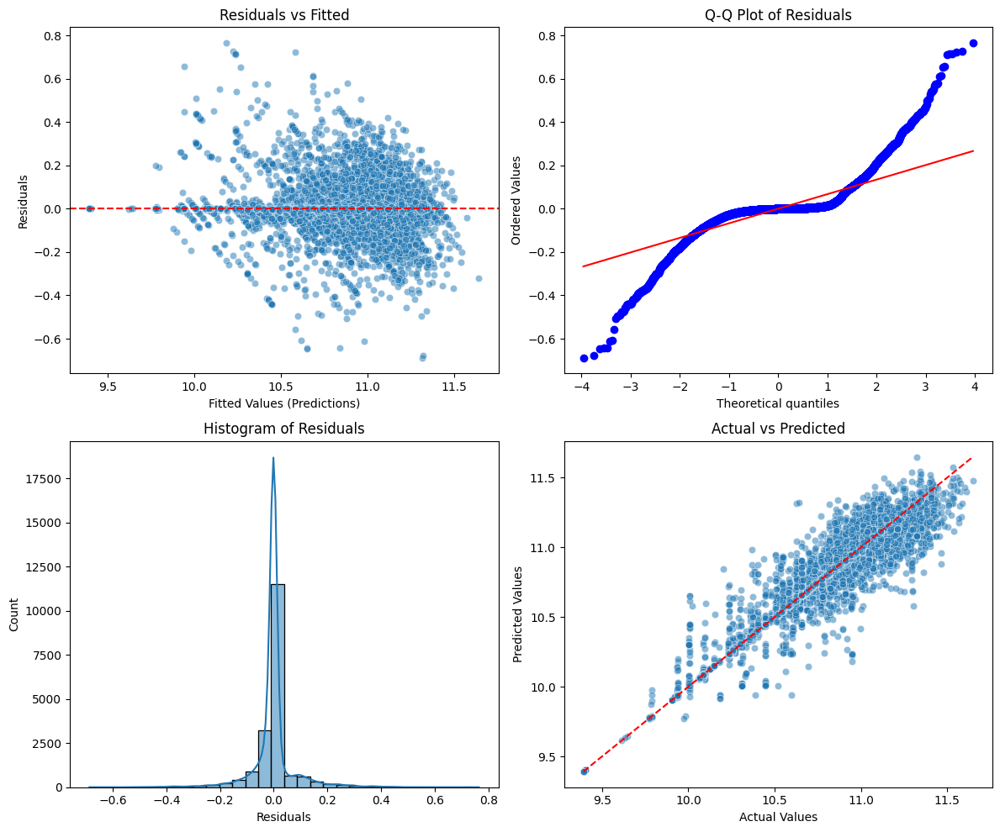

In [121]:
# plot diagnostic
dtest = xgb.DMatrix(X_test)
y_pred = final_model_bus.predict(dtest)
plot_diagnostic_trees(y_test, y_pred)

The Residuals vs Fitted plot shows how residuals are distributed across predicted values, where higher prices (business class) exhibit a slightly larger spread, suggesting some heteroscedasticity but no strong pattern. The Actual vs Predicted plot demonstrates the model's accuracy, with points closely following the red diagonal, indicating that predictions align well with actual values, though some deviations occur at higher values. The Histogram of Residuals reveals a distribution centered around zero with a sharp peak, suggesting that errors are mostly small, though some skewness or outliers might be present. The Q-Q Plot of Residuals assesses normality, showing some deviation from the ideal normal distribution, particularly in the tails, indicating potential issues with extreme values.

**Random Forest**

In [122]:
# pre-processing
X,y = CleanDataset_business.drop('price', axis=1), np.log(CleanDataset_business.price)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=30)

reg_bus = RandomForestRegressor(n_jobs=1)
reg_bus.fit(X_train, y_train)

RandomForestRegressor(n_jobs=1)

In [123]:
# evaluation
y_pred = reg_bus.predict(X_test)

print_metrics_tree(y_test, y_pred, "Random Forest model - Business")

 Random Forest model - Business - Performance Metrics:
 R² Score: 0.8774
 MAE: 2089.04
 RMSE: 4513.55
 MAPE: 3.61%


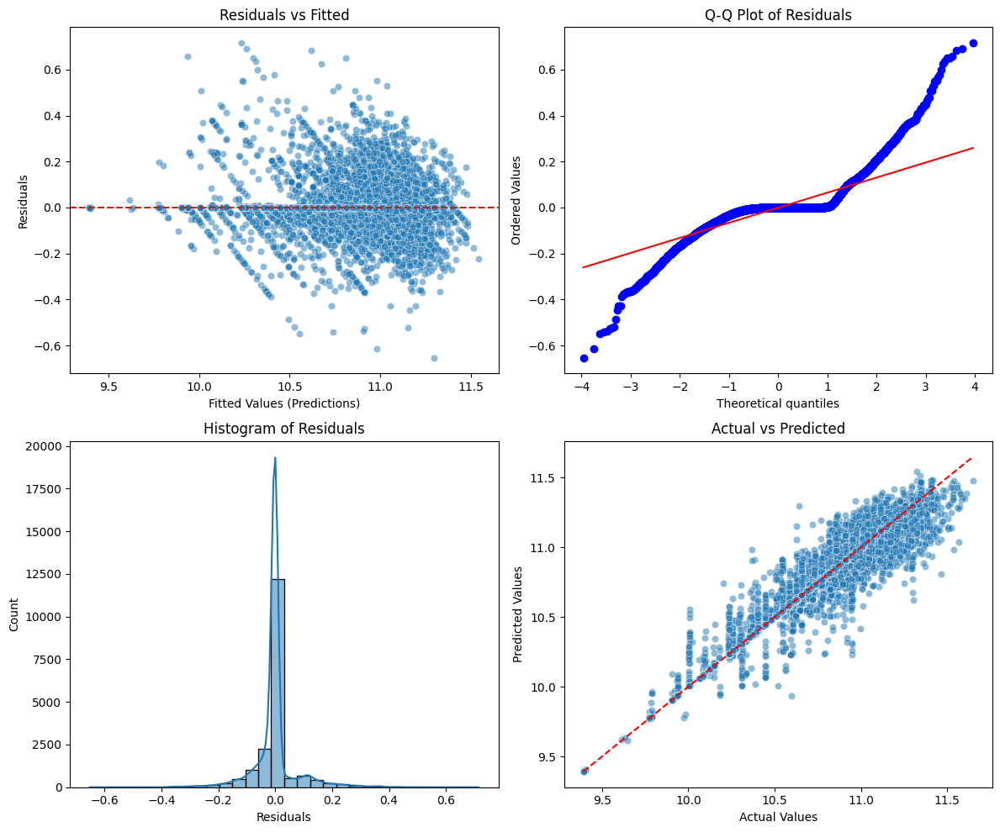

In [124]:
#plot diagnostic
y_pred = reg_bus.predict(X_test)
plot_diagnostic_trees(y_test, y_pred)

The *Residuals vs Fitted* plot shows residuals scattered around zero, indicating that the model generally captures the data's trend. However, there is some evidence of heteroscedasticity, as the spread of residuals varies across fitted values, suggesting that the model's error variance is not constant. The histogram of residuals and the Q-Q plot indicate that the residuals are not perfectly normally distributed, with some skewness and deviations from the theoretical quantiles.
The *Actual vs Predicted*"* plot shows a reasonable alignment between actual and predicted values, but there are noticeable deviations, particularly at the higher end of the scale. This suggests that while the model performs well for most data points, it struggles with accuracy for certain values, potentially indicating limitations in capturing the full complexity of the data.

## Results and Conclusions

### Result tables

This part of the paper, summarizes the results of all the models we presented. The goal of the tables is to compare under some common metrics the performance of the models trained on the datasets of interest. it is important to note that there is no model that can fit the data perfectly, but models that handle some aspects of our statistical anlysis optimally, such as complexity, explained variance, and prediction error.

**Linear Models and Variants for Complete Dataset**

| Model name                | $R^2$ train  | $R^2$ test | MAE     | RMSE    | MAPE   | AIC      | BIC      |
|:-------------------:|:-----:|:-------:|:-------:|:-------:|:------:|:--------:|:--------:|
| result_lr_complete  |  0.912 | 0.911   | 4583.92 | 6791.88 | 46.49% | 4.91e06  | 4.91e06  |
| result_lr_partial1  |  0.912 | 0.911   | 4584.58 | 6791.87 | 46.50% | 4.91e06  | 4.91e06  |
| result_lr_partial2  |  0.915 | 0.881   | 4605.23 | 7833.93 | 26.19% | 1.401e05 | 1.401e05 |
| result_pr_partial1  |  0.924 | 0.860   | 4716.45 | 8493.33 | 24.88% | 1.152e05 | 1.152e05 |
| ridge_regression    |  0.923 | 0.860   | 4716.35 | 8492.98 | 24.88% | -1.41e05 | -1.41e05 |


**Linear Models and Variants for Economy Dataset**

| Model name                    |  $R^2$ train   |  $R^2$ test | MAE     | RMSE    | MAPE   | AIC      | BIC      |
|:------------------------:|:-----:|:-------:|:-------:|:-------:|:------:|:--------:|:--------:|
| result_lr_complete_eco    | 0.502 | 0.510   | 1893.58 | 2612.79 | 33.86% | 3.075e06 | 3.075e06 |
| result_lr_partial1_eco    | 0.588 | 0.536   | 1707.51 | 2541.59 | 27.41% | 1.106e05 | 1.106e05 |
| result_lr_partial2_eco    | 0.654 | 0.610   | 1540.45 | 2329.30 | 24.53% | 8.2e04   | 8.23e04  |
| ridge_regression_eco    | 0.654 | 0.660   | 1540.45 | 2329.30 | 24.53% | -9.71e04  | -9.68e04  |

**Linear Model and Variants for Business Dataset**

| Model name               | $R^2$ train| $R^2$ test| MAE  | RMSE  | MAPE  | AIC   | BIC  |
|:------------------------:|:--------:|:--------:|:-------:|:-------:|:----------:|:---------:|:---------:|
| result_lr_complete_bus   | 0.527    | 0.523    | 6781.35 | 8897.94 | 13.97%     | 1.573e06  | 1.573e06  |
| result_lr_partial1_bus   | 0.615    | 0.526    | 6756.89 | 8876.05 | 13.53%     | -4.882e04 | -4.859e04 |
| result_lr_partial2_bus   | 0.630    | 0.544    | 6647.06 | 8700.15 | 13.27%     | -5.182e04 | -5.157e04 |
| ridge_regression_bus   | 0.630    | 0.630    | 6647.02 | 8700.14 | 13.27%     | -6.65e04 | -6.63e04 |

**MARS**

| Model name      | $R^2$ train   | $R^2$ test | MAE | RMSE      | MAPE | AIC | BIC |
|:---------------:|:--------:|:-------:|:----------:|:---------:|:---------:|:---------:|:---------:|
| mars_model_allclasses       |  0.945  | 0.945 | 3269.51 | 5697.62 | 20.04% | 9152.89 | 9296.93 |
| mars_model_economy        | 0.729  | 0.737 | 1347.96 | 2119.80 | 20.94% | 9439.12 | 9723.90 |
| mars_model_business   | 0.731 | 0.721 | 5744.14 | 7867.81 | 11.16% | -18591.92 | -18317.66 |

**Regression Trees, XGBoost and Random Forest approaches for Complete Dataset**

| Model name      | $R^2$    | MAE | RMSE | MAPE      |
|:---------------:|:--------:|:-------:|:----------:|:---------:|
| tree_reg        |  0.9760  | 1159.61 | 3518.97    | 7.25%     |
| XGBoost         |  0.9880  | 1044.99 | 2493.25    | 6.65%     |
| random_forest   |  0.9849  | 1057.18 | 2788.90    | 6.46%     |

**Regression Trees, XGBoost and Random Forest approaches for Economy Dataset**

| Model name      | $R^2$    | MAE | RMSE | MAPE      |
|:---------------:|:--------:|:-------:|:----------:|:---------:|
| tree_reg_eco         | 0.7548   | 684.08   | 1847.83  | 9.10%      |
| XGBoost_eco          | 0.8613   | 601.85   | 1369.66  | 8.18%      |
| random_forest_eco   | 0.8653   | 587.41   | 1369.50  | 7.77%      |

**Regression Trees, XGBoost and Random Forest approaches for Business Dataset**

| Model name      | $R^2$    | MAE | RMSE | MAPE      |
|:---------------:|:--------:|:-------:|:----------:|:---------:|
| tree_reg_bus         | 0.8084   | 2264.54  | 5641.60  | 3.90%      |
| XGBoost_bus          | 0.8743   | 2130.04  | 4569.41  | 3.74%      |
| random_forest_bus    | 0.8779   | 2084.50  | 4503.21  | 3.60%      |

### Conclusions

In conclusion, our analysis of the dataset and the subsequent modeling efforts have led several key insights. The dataset, characterized by its division into two distinct classes influencing ticket prices, presented challenges such as numerous outliers and a predominance of categorical variables, with only duration and days_left being numeric. The removal of the flight variable was necessary to refine our models. In terms of model quality, we explored various approaches to predict ticket prices across the two datasets. Linear and Polynomial Models, including those with interactions, were initially employed but were eventually supplemented by MARS and Ridge Regression to better manage outliers, VIF, heteroscedasticity, and prediction accuracy. These models effectively captured variance with relatively low complexity as indicated by AIC and BIC metrics. Ultimately, Regression Trees and XGBoost emerged as the top performers for this dataset.

Throughout the analysis, we addressed several critical aspects, including heteroscedasticity, normality of residuals, VIF and multicollinearity, non-linear features, and the application of logarithmic transformation on price. Splitting the dataset into two classes mitigated clustering issues but at the cost of reduced prediction accuracy. Overfitting was controlled through penalization techniques and validation on test sets.

Models on the different Datasets:

* Splitting the datasets reduced clustering problems but decreased prediction accuracy.
* Overfitting was managed using penalization and test set verification.
* The economy dataset had more observations, lower prices, and more outliers.
* The business dataset had higher prices but fewer observations.
* This comprehensive approach allowed us to develop robust models capable of handling the complexities inherent in the data, ultimately leading to more accurate and reliable price predictions.